# insurance fraud

In [1]:
#loading required libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
#loading dataset
df=pd.read_csv("insurancefraud.csv")
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


Column description
1.	months_as_customer: Number of months of patronage
2.	age: the length of time a customer has lived or a thing has existed
3.	policy_number: It is a unique id given to the customer, to track the subscription status and other details of customer
4.	policy_bind_date:date which document that is given to customer after we accept your proposal for insurance
5.	policy_state: This identifies who is the insured, what risks or property are covered, the policy limits, and the policy period
6.	policy_csl: is basically Combined Single Limit
7.	policy_deductable: the amount of money that a customer is responsible for paying toward an insured loss
8.	policy_annual_premium: This means the amount of Regular Premium payable by the Policyholder in a Policy Year
9.	umbrella_limit: This means extra insurance that provides protection beyond existing limits and coverages of other policies
10.	insured_zip: It is the zip code where the insurance was made
11.	insured_sex: This refres to either of the two main categories (male and female) into which customer are divided on the basis of their reproductive functions
12.	insured_education_level: This refers to the Level of education of the customer
13.	insured_occupation: This refers Occupation of the customer
14.	insured_hobbies: This refers to an activity done regularly by customer in his/her leisure time for pleasure.
15.	insured_relationship: This whether customer is: single; or. married; or. in a de facto relationship (that is, living together but not married); or. in a civil partnership
16.	capital-gains: This refers to profit accrued due to insurance premium
17.	capital-loss: This refers to the losses incurred due to insurance claims
18.	incident_date: This refers to the date which claims where made by customers
19.	incident_type: This refers to the type of claim/vehicle damage made by customer
20.	collision_type: This refers to the area of damage on the vehicle
21.	incident_severity: This refers to the extent/level of damage
22.	authorities_contacted: This refers to the government agencies that were contacted after damage
23.	incident_state: This refers to the state at which the accident happened
24.	incident_city: This refers to the city at which the accident happened
25.	1ncident_location: This refers to the location at which the accident happened
26.	incident_hour_of_the_day: The period of the day which accident took place
27.	number_of_vehicles_involved: This refers to number of vehicles involved the accident
28.	property_damage: This refers to whether property was damaged or not
29.	bodily_injuries: This refers to injuries sustained
30.	witnesses: This refers to the number of witnesses involved
31.	police_report_available: This refers to whether the report on damage was documented or not
32.	total_claim_amount: This refers to the financial implications involved in claims
33.	injury_claim: This refers to physical injuries sustained
34.	property_claim: This refers to property damages during incident
35.	vehicle_claim: This refers to property damages during incident
36.	auto_make: This refers to the make of the vehicle
37.	auto_model: This refers to the model of the vehicle
38.	auto_year: This refers to the year which the vehicle was manufactured
39.	_c39:
40.	fraud_reported


In [45]:
# checking shape of dataset
df.shape

(1000, 40)

In [46]:
#checking head of dataset
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [47]:
#checking tail of dataset
df.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,...,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


In [48]:
#checking sample of dataset
df.sample()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
186,177,34,226330,23-01-2013,IL,100/300,2000,1057.77,0,477382,...,NO,18000,2250,2250,13500,Audi,A3,2009,N,NaN


In [49]:
#checking columns of dataset
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [50]:
#checking datatype of dataset
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [3]:
# Convert the column to a date data type
df['policy_bind_date'] = pd.to_datetime(df['policy_bind_date'])

In [52]:
#checking information of datatype
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   months_as_customer           1000 non-null   int64         
 1   age                          1000 non-null   int64         
 2   policy_number                1000 non-null   int64         
 3   policy_bind_date             1000 non-null   datetime64[ns]
 4   policy_state                 1000 non-null   object        
 5   policy_csl                   1000 non-null   object        
 6   policy_deductable            1000 non-null   int64         
 7   policy_annual_premium        1000 non-null   float64       
 8   umbrella_limit               1000 non-null   int64         
 9   insured_zip                  1000 non-null   int64         
 10  insured_sex                  1000 non-null   object        
 11  insured_education_level      1000 non-null  

In [4]:
#Extracting Day from policy_bind_date column
df['Day'] = pd.to_datetime(df.policy_bind_date,format="%d/%m/%Y").dt.day

#Extracting Month from Date_of_journey column
df['Month'] = pd.to_datetime(df.policy_bind_date, format="%d/%m/%Y").dt.month

#Extracting Year from Date_of_journey column
df['Year'] = pd.to_datetime(df.policy_bind_date, format="%d/%m/%Y").dt.year

In [54]:
#Again checking information of datatype
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 43 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   months_as_customer           1000 non-null   int64         
 1   age                          1000 non-null   int64         
 2   policy_number                1000 non-null   int64         
 3   policy_bind_date             1000 non-null   datetime64[ns]
 4   policy_state                 1000 non-null   object        
 5   policy_csl                   1000 non-null   object        
 6   policy_deductable            1000 non-null   int64         
 7   policy_annual_premium        1000 non-null   float64       
 8   umbrella_limit               1000 non-null   int64         
 9   insured_zip                  1000 non-null   int64         
 10  insured_sex                  1000 non-null   object        
 11  insured_education_level      1000 non-null  

In [55]:
#Again check shape of dataset
df.shape

(1000, 43)

In [5]:
#dropping irrevant column date
df.drop(["policy_bind_date"],axis=1,inplace=True)

In [57]:
#Again check shape of dataset
df.shape

(1000, 42)

In [58]:
#checking no of unique values
df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage                   3
bodily_injuries             

In [14]:
# Checking which columns contains "?" sign
df[df.columns[(df == '?').any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

In [15]:
# Checking mode of the above columns
print("The mode of collision_type is:",df["collision_type"].mode())
print("The mode of property_damage is:",df["property_damage"].mode())
print("The mode of police_report_available is:",df["police_report_available"].mode())

The mode of collision_type is: 0    Rear Collision
Name: collision_type, dtype: object
The mode of property_damage is: 0    ?
Name: property_damage, dtype: object
The mode of police_report_available is: 0     ?
1    NO
Name: police_report_available, dtype: object


In [16]:
# Checking value count of property_damage column and police_report_available
print("The value count of property_damage:\n", df["property_damage"].value_counts())
print("\n")
print("The value count of police_report_available:\n", df["police_report_available"].value_counts())

The value count of property_damage:
 ?      360
NO     338
YES    302
Name: property_damage, dtype: int64


The value count of police_report_available:
 ?      343
NO     343
YES    314
Name: police_report_available, dtype: int64


In [59]:
# checking unique values for fraud_reported
df["fraud_reported"].unique()

array(['Y', 'N'], dtype=object)

In [17]:
# Replacing "?" by their mode values
df['collision_type'] = df.collision_type.str.replace('?', df['collision_type'].mode()[0])
df['property_damage'] = df.property_damage.str.replace('?', "NO")
df['police_report_available'] = df.police_report_available.str.replace('?', "NO")

In [18]:
# Checking value count again
print("The value count of collision_type:\n", df["collision_type"].value_counts())
print("\n")
print("The value count of property_damage:\n", df["property_damage"].value_counts())
print("\n")
print("The value count of police_report_available:\n", df["police_report_available"].value_counts())

The value count of collision_type:
 Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


The value count of property_damage:
 NO     698
YES    302
Name: property_damage, dtype: int64


The value count of police_report_available:
 NO     686
YES    314
Name: police_report_available, dtype: int64


In [60]:
# checking for null values
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage                   0
bodily_injuries             

null value are present in only one column

<AxesSubplot:>

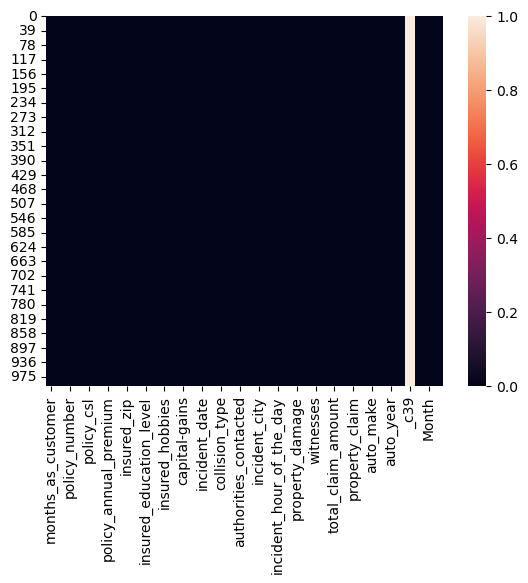

In [61]:
#visualization of null values
sns.heatmap(df.isnull())

here it is clearly observed that one complete column have null value . so I dropped that column

In [6]:
# drooping irrevant columns
df.drop("_c39",axis=1,inplace=True)

In [20]:
# Dropping incident_date column 
df.drop("incident_date", axis=1, inplace=True)

In [7]:
df.drop("policy_number",axis=1,inplace=True)

In [64]:
#again checking shape
df.shape

(1000, 40)

<AxesSubplot:>

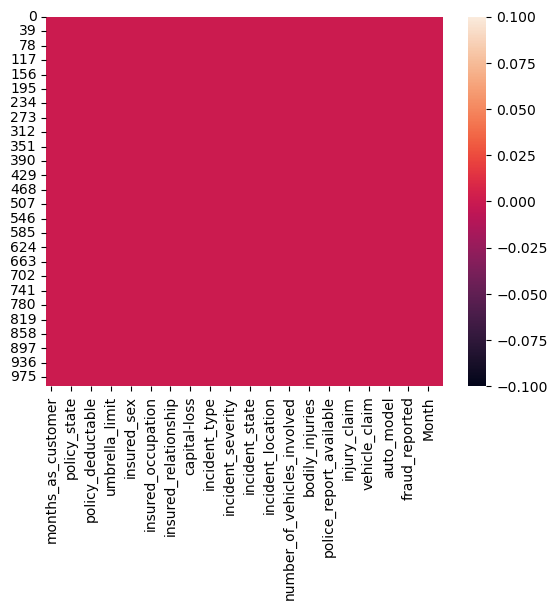

In [65]:
#Again visualization of null values
sns.heatmap(df.isnull())

no null value is present

In [21]:
# checking for white space
# Iterate through each column of the dataframe and check for white spaces
for col in df.columns:
    # Count the number of white spaces in the column
    num_spaces = sum(df[col].astype(str).apply(lambda x: x.isspace()))

    # Display the results
    print(f"Column '{col}' has {num_spaces} white spaces.")

Column 'months_as_customer' has 0 white spaces.
Column 'age' has 0 white spaces.
Column 'policy_state' has 0 white spaces.
Column 'policy_csl' has 0 white spaces.
Column 'policy_deductable' has 0 white spaces.
Column 'policy_annual_premium' has 0 white spaces.
Column 'umbrella_limit' has 0 white spaces.
Column 'insured_zip' has 0 white spaces.
Column 'insured_sex' has 0 white spaces.
Column 'insured_education_level' has 0 white spaces.
Column 'insured_occupation' has 0 white spaces.
Column 'insured_hobbies' has 0 white spaces.
Column 'insured_relationship' has 0 white spaces.
Column 'capital-gains' has 0 white spaces.
Column 'capital-loss' has 0 white spaces.
Column 'incident_type' has 0 white spaces.
Column 'collision_type' has 0 white spaces.
Column 'incident_severity' has 0 white spaces.
Column 'authorities_contacted' has 0 white spaces.
Column 'incident_state' has 0 white spaces.
Column 'incident_city' has 0 white spaces.
Column 'incident_location' has 0 white spaces.
Column 'incid

no white space is present

In [22]:
# splitting the dataset in numerical and categorical dataset
# checking for categorical columns
categorical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_col.append(i)
print(categorical_col)

['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


In [23]:
# Now checking for numerical columns
numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_col.append(i)
print(numerical_col)

['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', 'Day', 'Month', 'Year']


### Visualization

### univariant analysis for categorical column

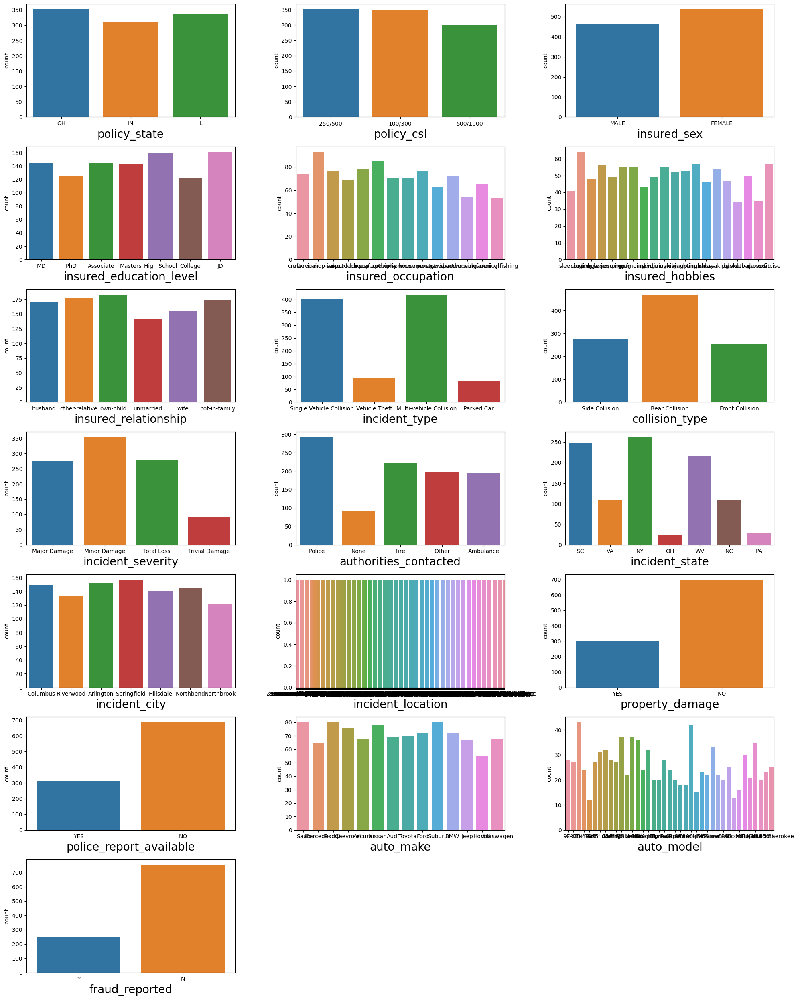

In [24]:

plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in categorical_col:
    if plotnumber<=20:
        ax=plt.subplot(7,3,plotnumber)
        sns.countplot(df[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

Observation:
1. Count of OH is high in policy state followed by IL,IN
2. count of 250/500 and 100/300 in policy_cl is same.
3. Females are higher than male.
4. JD and high school are same and high in education level followed by MD,associate , masters
5. Own child is higher in number followed by other relative, not in family , husband
6. In incident type multivehical collision is high followed by single vehical collision and theft
7. rare collision is high count in collision type
8. In incident severity minor damade is higher in count
9. count of police is high in authority contacted.
10. NY is place where incident occure highly followed by SC, WV, NC
11. springfied is a city of higher occurance incident followed by arlington columbus.
12. NO property damage recorded higher than yes
13. In most of the cases police report was not available
14. No froud reported is higher in count that yes

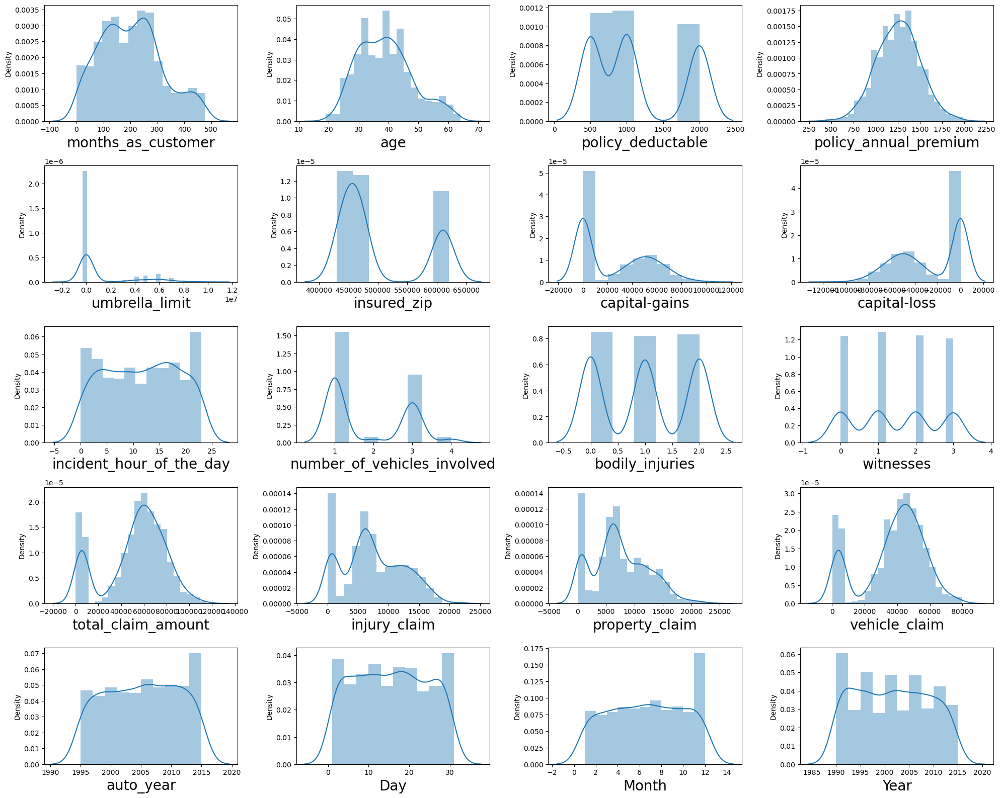

In [25]:
#Checking the univariant analysis on the DataSet on numerical column
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

### Bivariant analysis

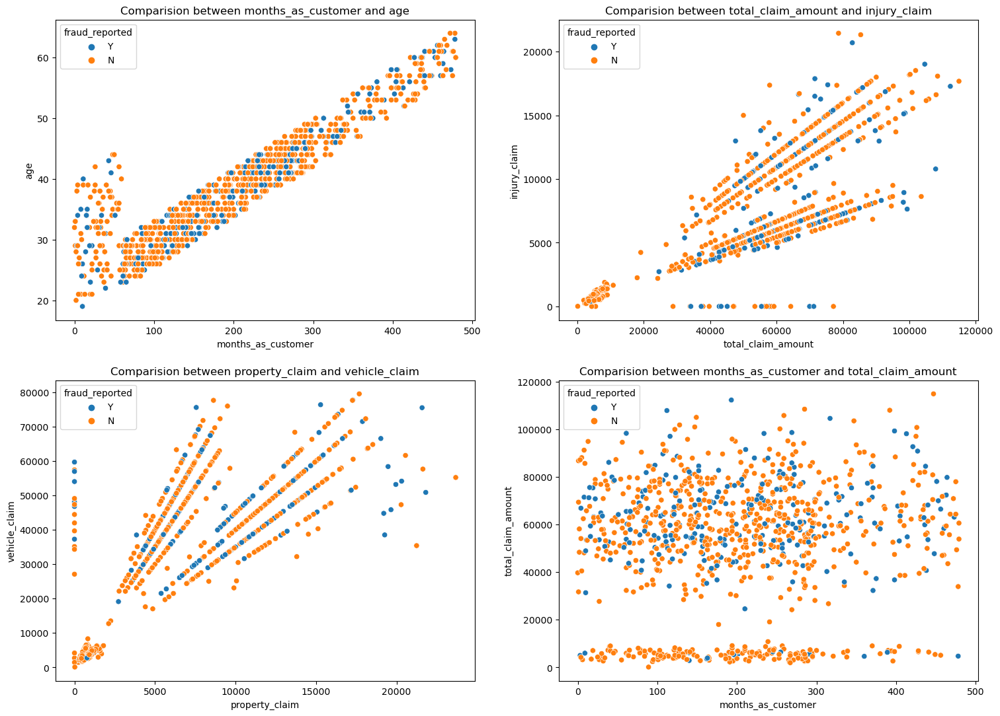

In [31]:
# Comparision between two variables
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between months_as_customer and age')
sns.scatterplot(df['months_as_customer'],df['age'],hue=df['fraud_reported']);

plt.subplot(2,2,2)
plt.title('Comparision between total_claim_amount and injury_claim')
sns.scatterplot(df['total_claim_amount'],df['injury_claim'],hue=df['fraud_reported']);

plt.subplot(2,2,3)
plt.title('Comparision between property_claim and vehicle_claim')
sns.scatterplot(df['property_claim'],df['vehicle_claim'],hue=df['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between months_as_customer and total_claim_amount')
sns.scatterplot(df['months_as_customer'],df['total_claim_amount'],hue=df['fraud_reported']);

Observation:
1. There is a positive linear relation between age and month_as_customer column. As age increases the month_as customers also increases, also the fraud reported is very less in htis case. 
2. In the second graph we cna observe the positive linear relation, as total cliam amount increases, injury claim is also increases.
3. Third plot is also same as second one that is as the property claim increases, vehicle claim is also increases. 
4. In the fourth plot we can observe the data is scattered and there is no much relation between the features.    

In [33]:
df.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'umbrella_limit',
       'insured_zip', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'capital-gains', 'capital-loss', 'incident_type', 'collision_type',
       'incident_severity', 'authorities_contacted', 'incident_state',
       'incident_city', 'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', 'Day', 'Month', 'Year'],
      dtype='object')

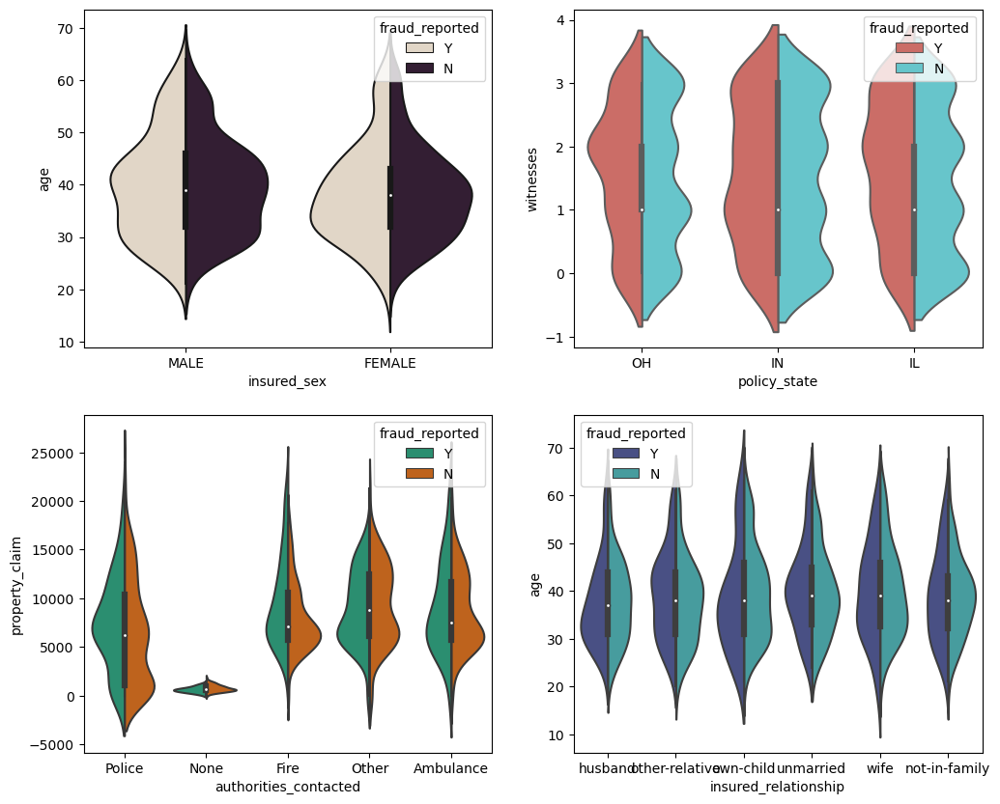

In [34]:
fig,axes=plt.subplots(2,2,figsize=(12,10))

# Comparing insured_sex and age
sns.violinplot(x='insured_sex',y='age',ax=axes[0,0],data=df,palette="ch:.25",hue="fraud_reported",split=True)

# Comparing policy_state and witnesses
sns.violinplot(x='policy_state',y='witnesses',ax=axes[0,1],data=df,hue="fraud_reported",split=True,palette="hls")

# Comparing csl_per_accident and property_claim
sns.violinplot(x='authorities_contacted',y='property_claim',ax=axes[1,0],data=df,hue="fraud_reported",split=True,palette="Dark2")

# Comparing csl_per_person and age
sns.violinplot(x='insured_relationship',y='age',ax=axes[1,1],data=df,hue="fraud_reported",split=True,palette="mako")
plt.show()

Observation:
1. The fraud report is high for both the males females having age between 30-45.
2. The people who own the policy state "IN" have high fraud report. 
3. The person who who contacted fire other and ambulnce in the range 5000-15000 have the fraud report. 
4. The person with age 30-45 are facing the fraudulent reports.

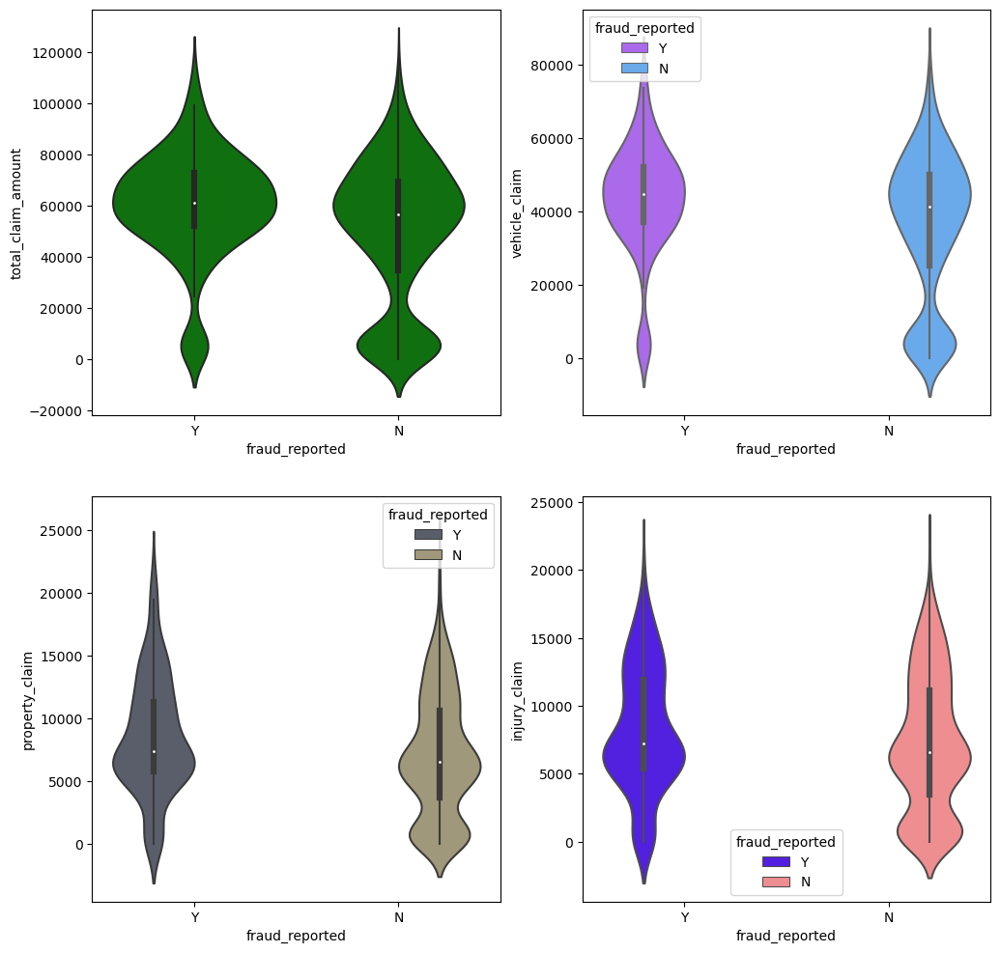

In [35]:
fig,axes=plt.subplots(2,2,figsize=(12,12))

# Comparing insured_sex and age
sns.violinplot(x='fraud_reported',y='total_claim_amount',ax=axes[0,0],data=df,color="g")

# Comparing policy_state and witnesses
sns.violinplot(x='fraud_reported',y='vehicle_claim',ax=axes[0,1],data=df,hue="fraud_reported",palette="cool_r")

# Comparing csl_per_accident and property_claim
sns.violinplot(x='fraud_reported',y='property_claim',ax=axes[1,0],data=df,hue="fraud_reported",palette="cividis")

# Comparing csl_per_person and age
sns.violinplot(x='fraud_reported',y='injury_claim',ax=axes[1,1],data=df,hue="fraud_reported",palette="gnuplot2")
plt.show()

Observation:
1. Most of the fraud reports found when the total claimed amount is 5000-70000. 
2. The fraud report is high when the claimed vehicle is between 3700-5900. 
3. The frad reports is high when the property claimed is between 5200-8500.
4. Most fraud reported when injury claim are between 5000 to 8000.

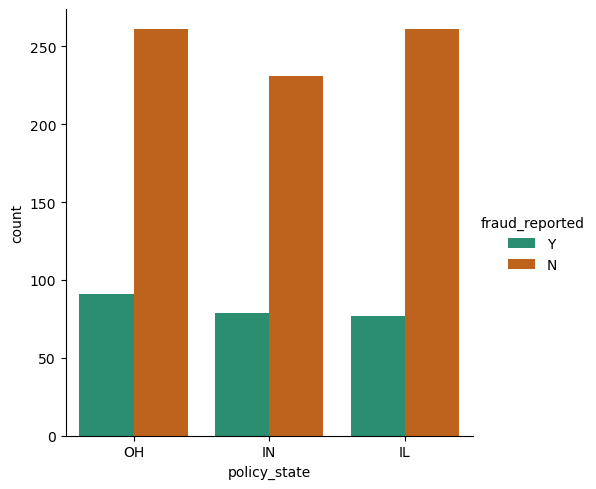

In [39]:
# Comparing policy_state and fraud_reported
sns.factorplot('policy_state',kind='count',data=df,hue='fraud_reported',palette="Dark2")
plt.show()

Fraud report is bit high in the "OH" policy state.

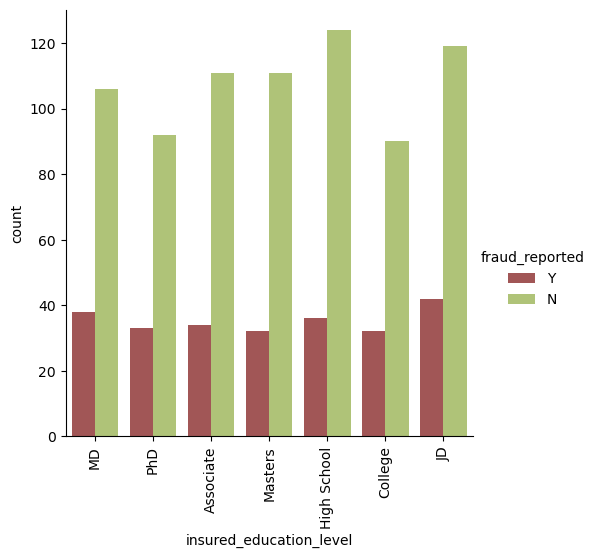

In [40]:
# Comparing insured_education_level and fraud_reported

sns.factorplot('insured_education_level',kind='count',data=df,hue='fraud_reported',palette="tab20b_r")
plt.xticks(rotation=90)
plt.show()

The fraudulent level is very less for the people who have high school education and the people who have completed their "JD" education have high fraud report. The people who have high insured education are facing insurance fraudulent compared to the people with less insured education level.

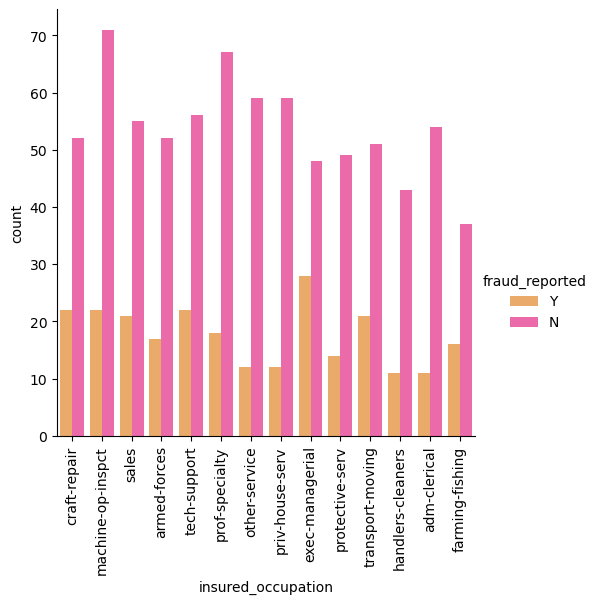

In [41]:
# Comparing insured_occupation and fraud_reported
sns.factorplot('insured_occupation',kind='count',data=df,hue='fraud_reported',palette="spring_r")
plt.xticks(rotation=90)
plt.show()

The people who are in the position exec-managerials have high fraud reports compared to others.

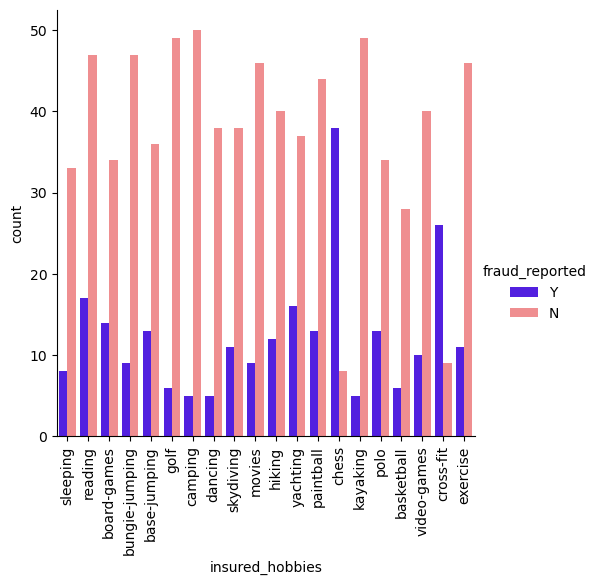

In [43]:
# Comparing insured_hobbies and fraud_reported
sns.factorplot('insured_hobbies',kind='count',data=df,hue='fraud_reported',palette="gnuplot2")
plt.xticks(rotation=90)
plt.show()

The fraud report is high for the people who have the hobby of playing chess and cross fit.

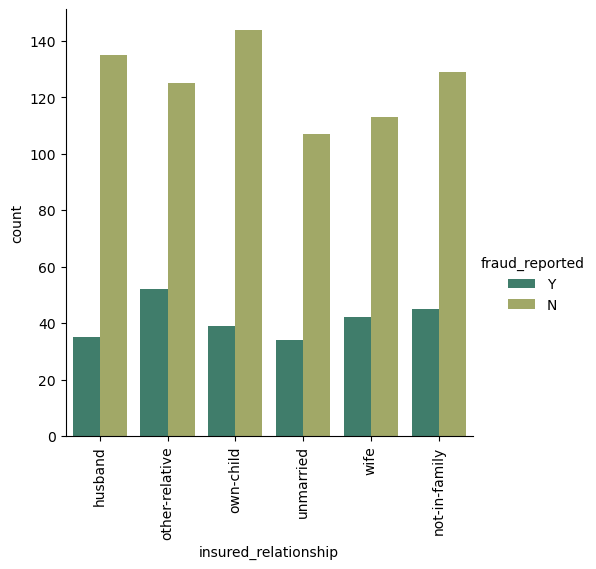

In [44]:
# Comparing insured_relationship and fraud_reported
sns.factorplot('insured_relationship',kind='count',data=df,hue='fraud_reported',palette="gist_earth")
plt.xticks(rotation=90)
plt.show()

The fraud report is higmh for the customers who have other relative and it is very less for unmarried people.

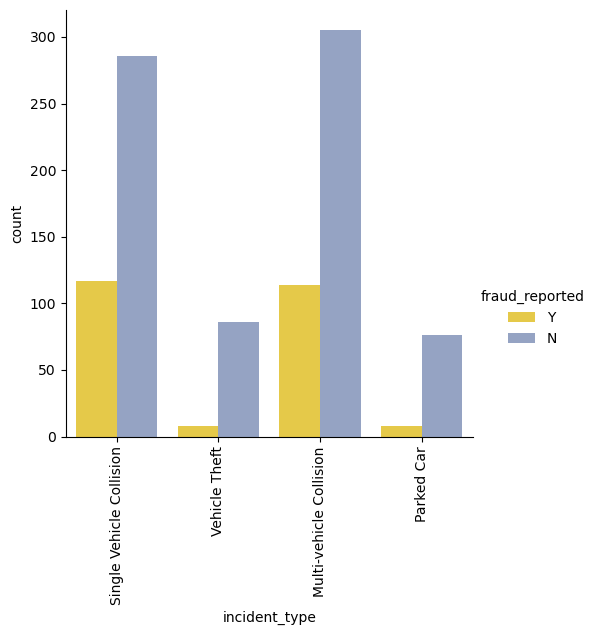

In [45]:
# Comparing incident_type and fraud_reported
sns.factorplot('incident_type',kind='count',data=df,hue='fraud_reported',palette="Set2_r")
plt.xticks(rotation=90)
plt.show()

In Multivehicle collission and single vehicle collision, the fraud report is very high compared to others.

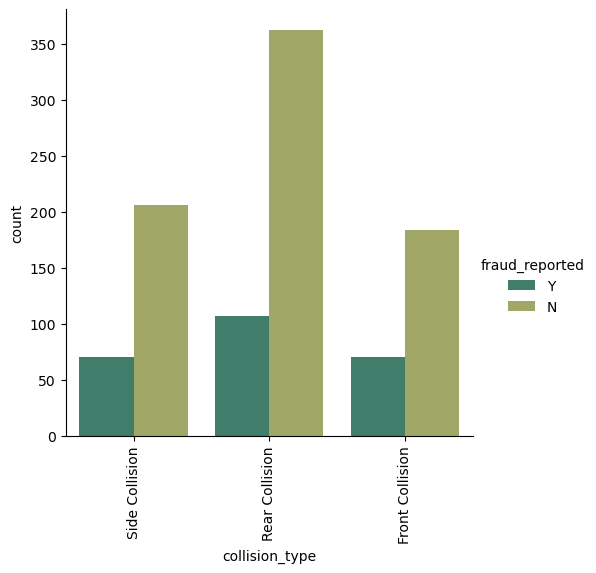

In [46]:
# Comparing collision_type and fraud_reported
sns.factorplot('collision_type',kind='count',data=df,hue='fraud_reported',palette="gist_earth")
plt.xticks(rotation=90)
plt.show()

The fraud level is high in the collision type Rear Collision and other two collision type have average reports.

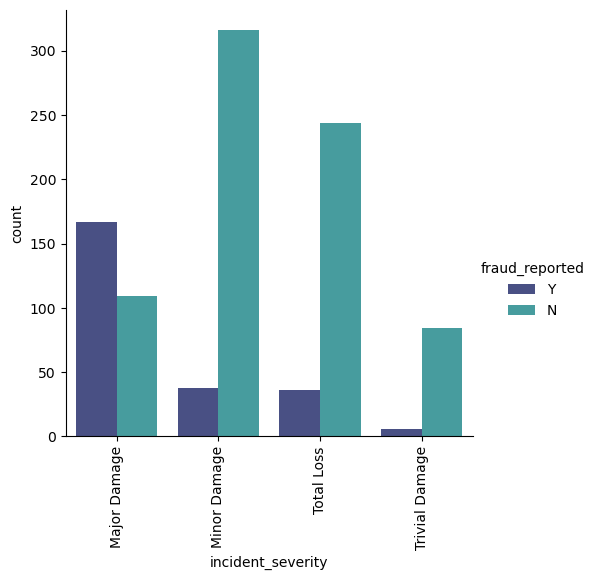

In [47]:
# Comparing incident_severity and fraud_reported
sns.factorplot('incident_severity',kind='count',data=df,hue='fraud_reported',palette="mako")
plt.xticks(rotation=90)
plt.show()

The fraud report is high in Major damage incident severity and for Trivial Damage the report is less compared to others.

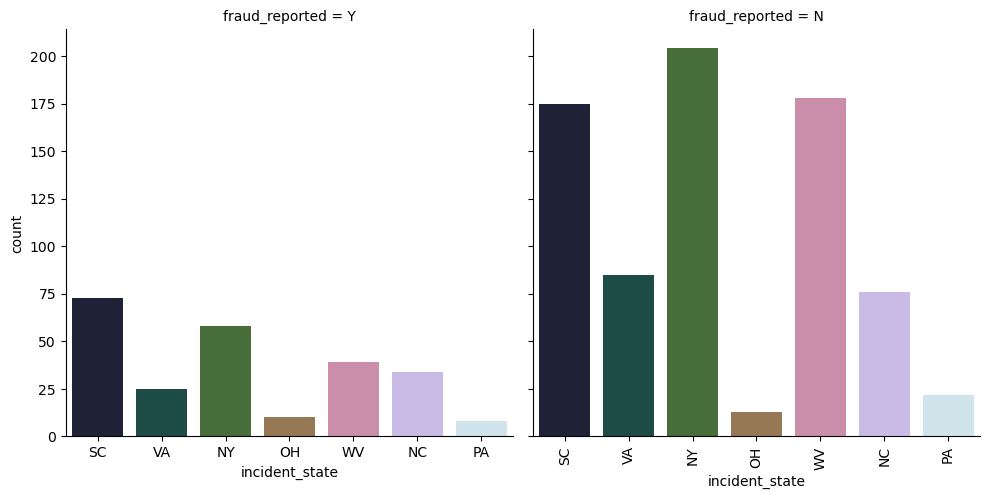

In [49]:
# Comparing incident_state and fraud_reported
sns.factorplot('incident_state',kind='count',data=df,col='fraud_reported',palette="cubehelix")
plt.xticks(rotation=90)
plt.show()

The state SC has high fraud reports compared to other states.

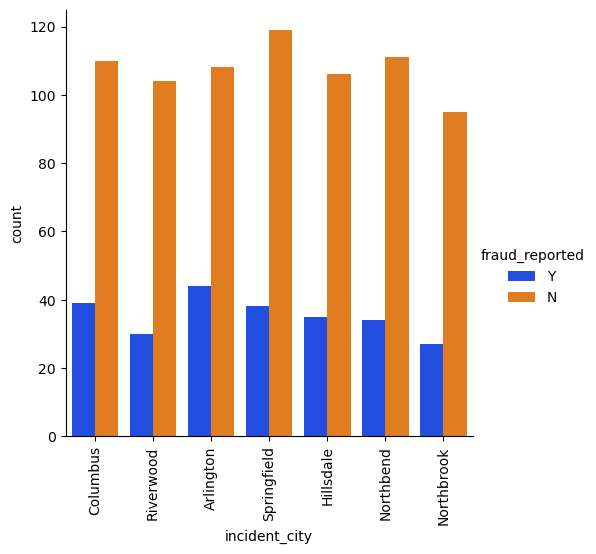

In [50]:
# Comparing incident_city and fraud_reported
sns.catplot('incident_city',kind='count',data=df,hue='fraud_reported',palette="bright")
plt.xticks(rotation=90)
plt.show()

The cities Riverwood and Northbrook have very less fraud reports compared to others.

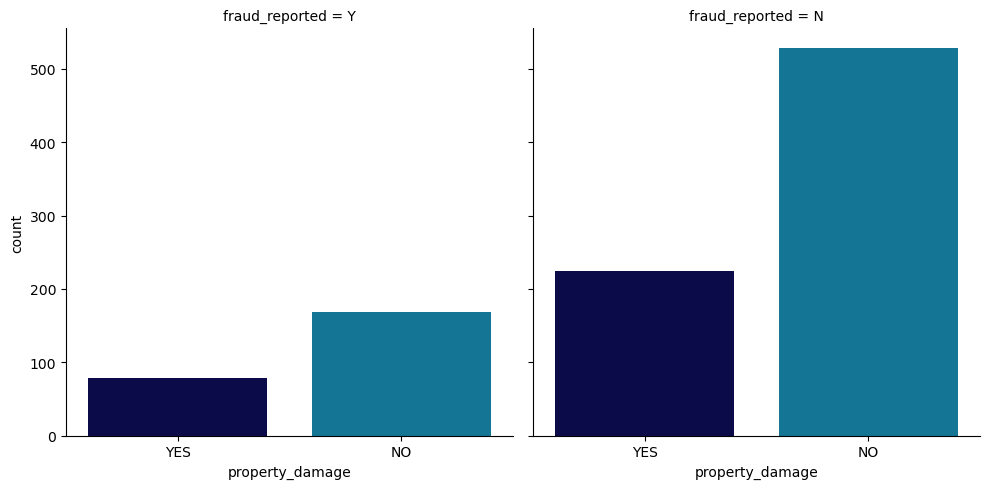

In [51]:
# Comparing property_damage and fraud_reported
sns.factorplot('property_damage',kind='count',data=df,col='fraud_reported',palette="ocean")
plt.show()

The customers who do not have any property damage case they have high fraud reports.

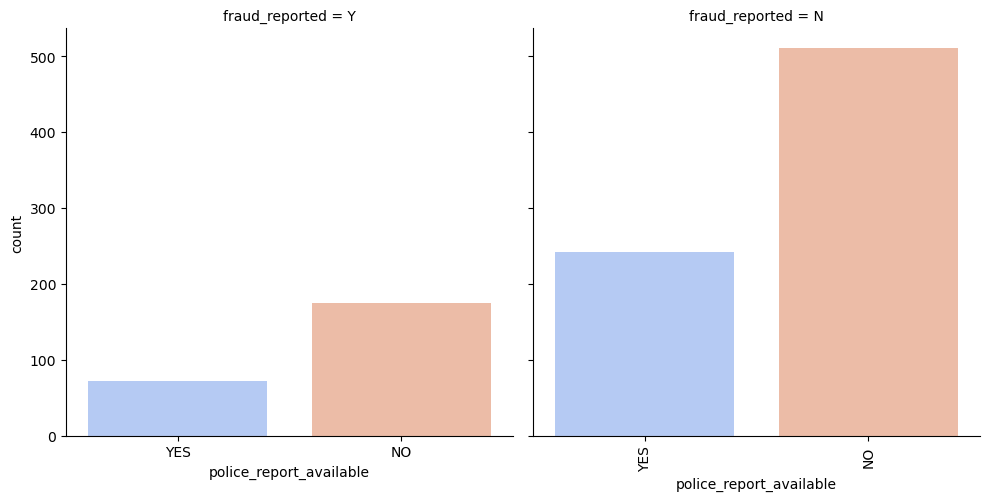

In [52]:
# Comparing police_report_available and fraud_reported
sns.factorplot('police_report_available',kind='count',data=df,col='fraud_reported',palette="coolwarm")
plt.xticks(rotation=90)
plt.show()

If there is no police report available then the fraud report is very high.

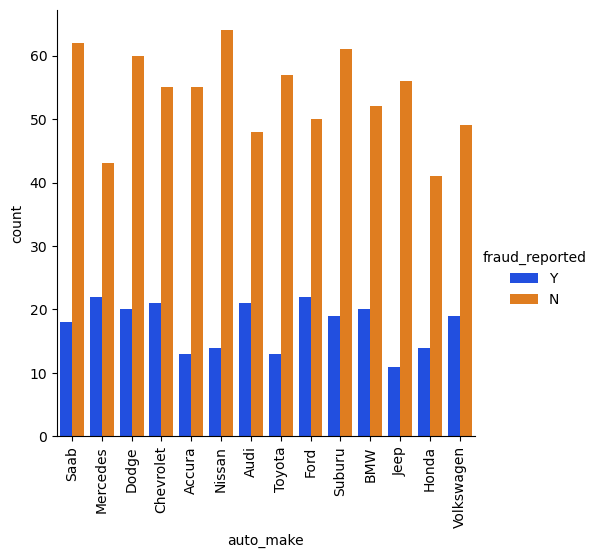

In [53]:
# Comparing auto_make and fraud_reported
sns.catplot('auto_make',kind='count',data=df,hue='fraud_reported',palette="bright")
plt.xticks(rotation=90)
plt.show()

in all the auto make cases the fraud report is almost same.

### Multivariate Analysis

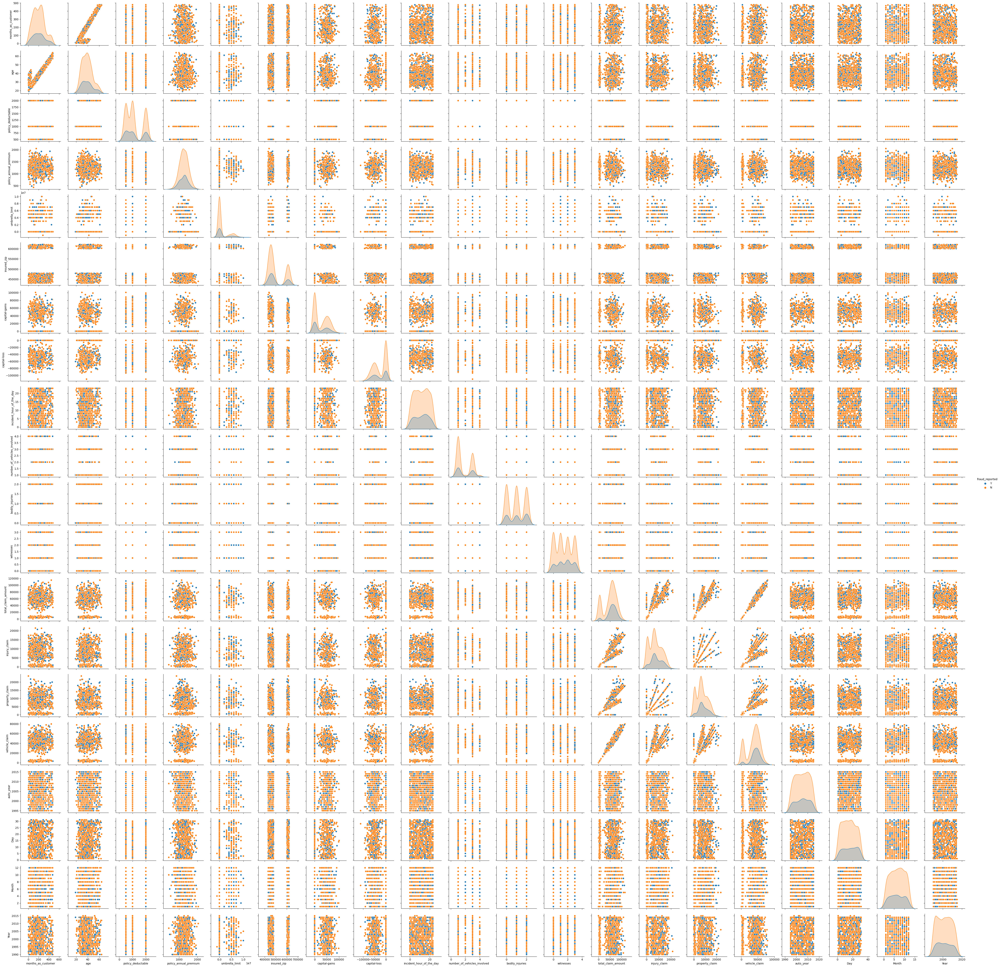

In [59]:
sns.pairplot(df,hue="fraud_reported")
plt.show()

### Statistical summary

In [69]:
# statistical summary of numerical columns
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,Day,Month,Year
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,15.448000,6.559000,2001.604000
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,8.850176,3.391758,7.360391
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,1.000000,1.000000,1990.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,8.000000,4.000000,1995.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,16.000000,7.000000,2002.000000
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,23.000000,9.000000,2008.000000
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,31.000000,12.000000,2015.000000


Observation:

1. count is same for all columns.
2. there is no much more difference between mean and median , so data is normally distributted'
3. possiblity of outlier as difference between 2rd quantile and max value is large

In [70]:
# statistical summary of categorical columns
df.describe(include=['O'])

,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,property_damage,police_report_available,auto_make,auto_model,fraud_reported
count,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique,3,3,2,7,14,20,6,60,4,4,4,5,7,7,1000,3,3,14,39,2
top,OH,250/500,FEMALE,JD,machine-op-inspct,reading,own-child,02-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Springfield,9935 4th Drive,?,?,Saab,RAM,N
freq,352,351,537,161,93,64,183,28,419,292,354,292,262,157,1,360,343,80,43,753


<AxesSubplot:>

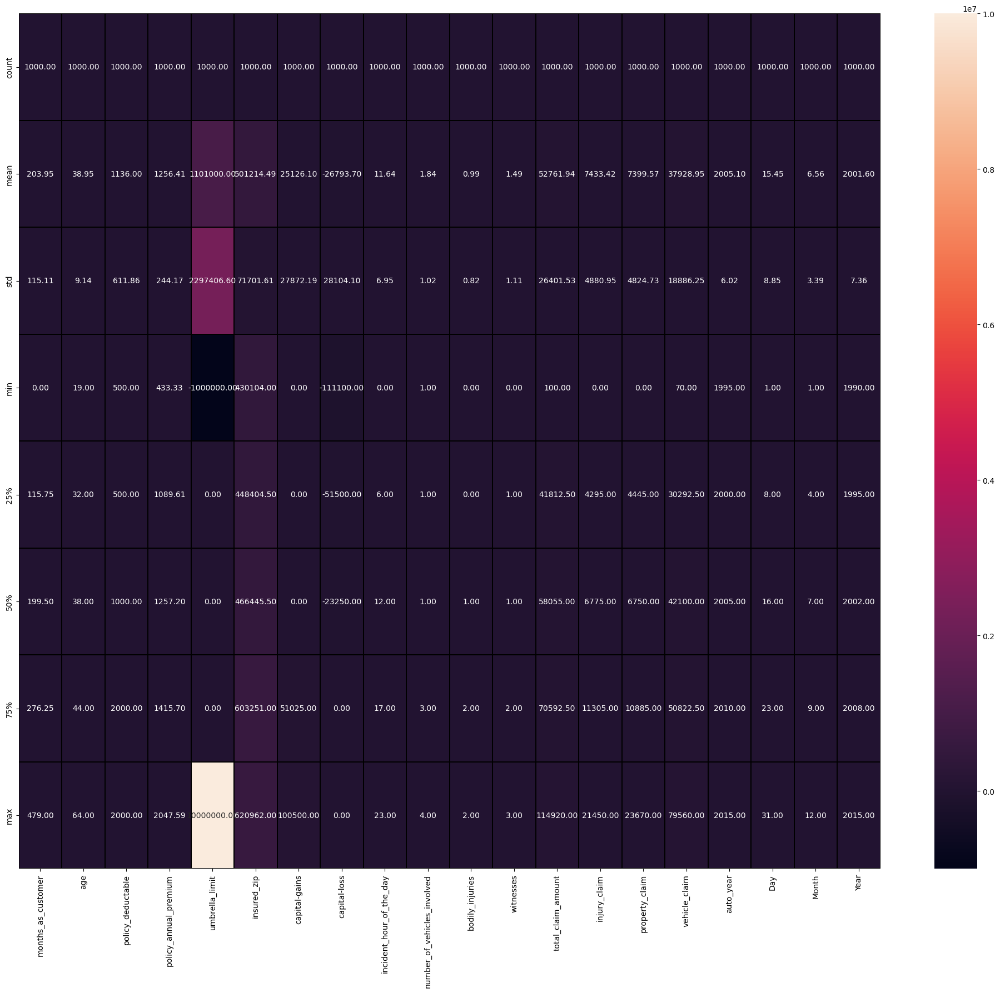

In [71]:
# visualize df.describe
plt.figure(figsize=(25,20))
sns.heatmap(df.describe(),annot=True,linewidth=0.1,linecolor="black",fmt="0.2f")

In [72]:
#converting categorical data into numerical data
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
cols=['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']
df[cols] = df[cols].apply(LabelEncoder().fit_transform)
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Day,Month,Year
0,328,48,2,1,1000,1406.91,0,466132,1,4,...,6510,13020,52080,10,1,2004,1,17,10,2014
1,228,42,1,1,2000,1197.22,5000000,468176,1,4,...,780,780,3510,8,12,2007,1,27,6,2006
2,134,29,2,0,2000,1413.14,5000000,430632,0,6,...,7700,3850,23100,4,30,2007,0,9,6,2000
3,256,41,0,1,2000,1415.74,6000000,608117,0,6,...,6340,6340,50720,3,34,2014,1,25,5,1990
4,228,44,0,2,1000,1583.91,6000000,610706,1,0,...,1300,650,4550,0,31,2009,0,6,6,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,2,1000,1310.80,0,431289,0,5,...,17440,8720,61040,6,6,2006,0,16,7,1991
996,285,41,0,0,1000,1436.79,0,608177,0,6,...,18080,18080,72320,13,28,2015,0,1,5,2014
997,130,34,2,1,500,1383.49,3000000,442797,0,5,...,7500,7500,52500,11,19,1996,0,17,2,2003
998,458,62,0,2,2000,1356.92,5000000,441714,1,0,...,5220,5220,36540,1,5,1998,0,18,11,2011


<AxesSubplot:>

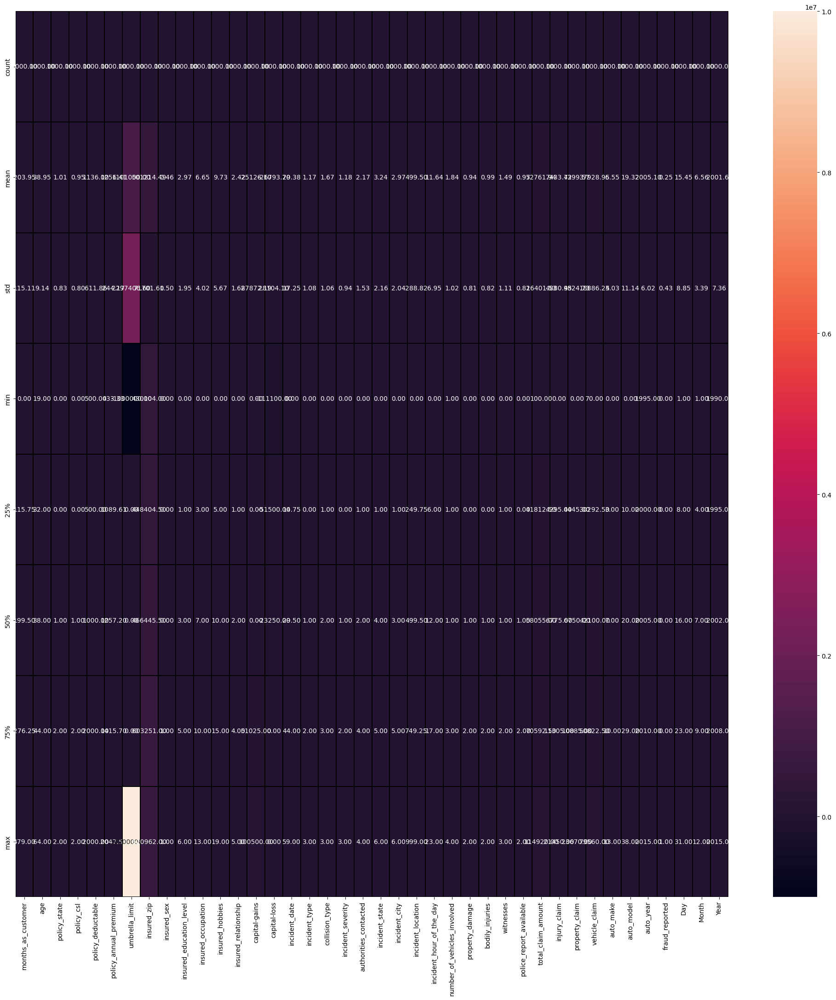

In [73]:
#  again visualize df.describe
plt.figure(figsize=(25,25))
sns.heatmap(df.describe(),annot=True,linewidth=0.1,linecolor="black",fmt="0.2f")

In [74]:
#correlation
df.corr()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Day,Month,Year
months_as_customer,1.000000,0.922098,-0.000328,-0.026819,0.026807,0.005018,0.015498,0.017895,0.060925,-0.000833,...,0.065329,0.034940,0.061013,0.047655,0.004202,-0.000292,0.020544,0.051728,0.005750,-0.048276
age,0.922098,1.000000,-0.014533,-0.015185,0.029188,0.014404,0.018126,0.025604,0.073337,0.000969,...,0.075522,0.060898,0.062588,0.030410,0.017343,0.001354,0.012143,0.053869,0.015501,-0.037444
policy_state,-0.000328,-0.014533,1.000000,0.001027,0.010033,0.012455,-0.029580,0.008777,-0.020481,-0.034327,...,-0.046290,0.008406,0.001425,0.017124,-0.025253,0.002114,0.029432,0.002277,0.071450,-0.007276
policy_csl,-0.026819,-0.015185,0.001027,1.000000,0.003384,0.023978,0.021636,0.006879,-0.010757,0.009153,...,-0.078818,-0.042216,-0.046791,-0.004701,0.047885,-0.033082,-0.037190,0.018973,-0.045345,-0.016466
policy_deductable,0.026807,0.029188,0.010033,0.003384,1.000000,-0.003245,0.010870,0.004545,-0.009733,0.015217,...,0.039107,0.064792,0.005269,-0.035379,-0.003268,0.026105,0.014817,0.009164,-0.050416,-0.049598
policy_annual_premium,0.005018,0.014404,0.012455,0.023978,-0.003245,1.000000,-0.006247,0.032354,0.038853,-0.019715,...,-0.017633,-0.011654,0.020246,0.000045,-0.031849,-0.049226,-0.014480,-0.025183,-0.035355,0.001249
umbrella_limit,0.015498,0.018126,-0.029580,0.021636,0.010870,-0.006247,1.000000,0.019671,0.010688,-0.019357,...,-0.045412,-0.023790,-0.038584,-0.004443,0.040256,0.009893,0.058622,-0.045207,0.009961,0.048008
insured_zip,0.017895,0.025604,0.008777,0.006879,0.004545,0.032354,0.019671,1.000000,-0.036942,0.016079,...,-0.017495,-0.006841,-0.041083,-0.020892,0.023637,-0.032736,0.019368,-0.039867,0.015864,-0.001100
insured_sex,0.060925,0.073337,-0.020481,-0.010757,-0.009733,0.038853,0.010688,-0.036942,1.000000,0.009002,...,0.000924,-0.014868,-0.029609,0.026457,-0.018421,-0.028247,0.030873,0.040713,-0.004033,-0.032891
insured_education_level,-0.000833,0.000969,-0.034327,0.009153,0.015217,-0.019715,-0.019357,0.016079,0.009002,1.000000,...,0.081880,0.055794,0.068348,0.055202,0.049445,0.043509,0.008808,0.012610,-0.007118,0.018952


<AxesSubplot:>

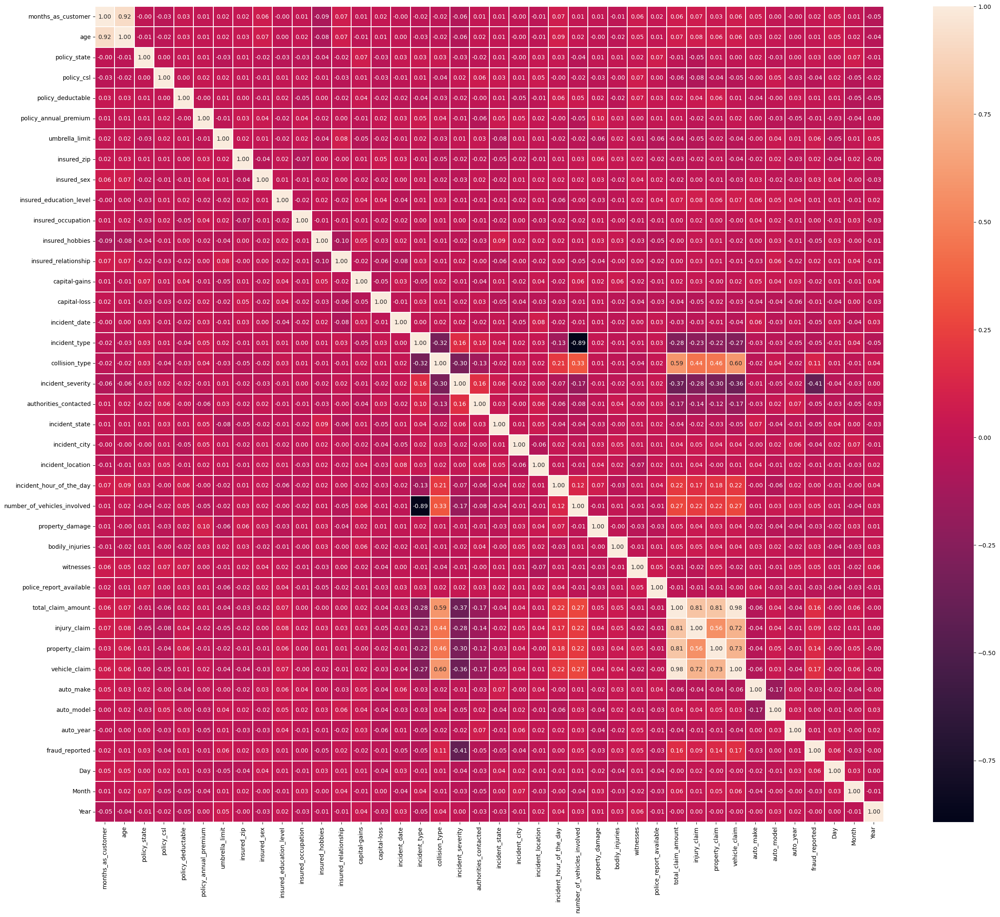

In [75]:
# visualize the correlation
plt.figure(figsize=(30,25))
sns.heatmap(df.corr(),linewidths=0.1,fmt='0.2f',annot=True)

In [76]:
# correlation of column with target column Rainfall
df.corr()["fraud_reported"].sort_values()

incident_severity             -0.405988
incident_state                -0.051407
incident_type                 -0.050376
incident_date                 -0.047726
insured_hobbies               -0.046838
authorities_contacted         -0.045802
incident_city                 -0.040403
policy_csl                    -0.037190
Month                         -0.030829
property_damage               -0.030497
police_report_available       -0.028159
auto_make                     -0.027519
capital-gains                 -0.019173
capital-loss                  -0.014863
policy_annual_premium         -0.014480
incident_location             -0.008832
Year                          -0.000059
auto_model                     0.000720
insured_occupation             0.001564
incident_hour_of_the_day       0.004316
auto_year                      0.007928
insured_education_level        0.008808
age                            0.012143
policy_deductable              0.014817
insured_zip                    0.019368


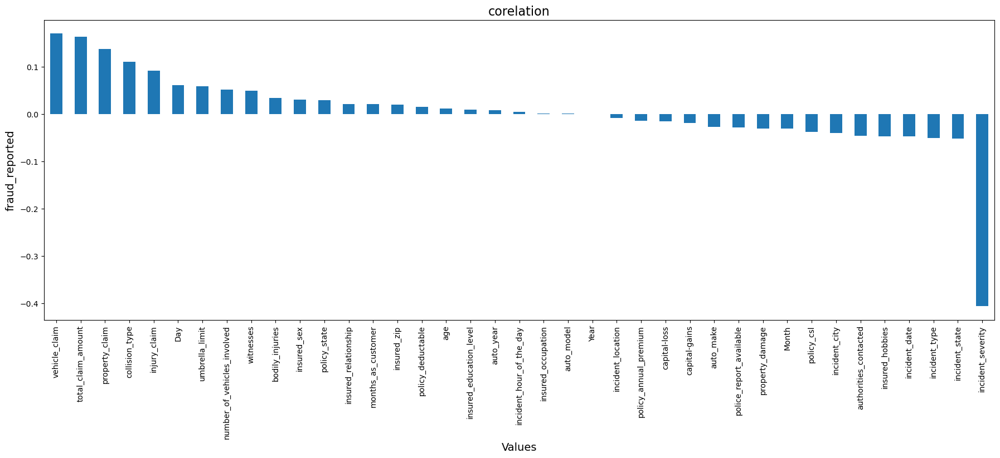

In [77]:
plt.figure(figsize=(22,7))
df.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar')
plt.xlabel('Values',fontsize=14)
plt.ylabel('fraud_reported',fontsize=14)
plt.title('corelation',fontsize=16)
plt.show()

In [78]:
# skewness
df.skew()

months_as_customer             0.362177
age                            0.478988
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_date                  0.004756
incident_type                  0.101507
collision_type                -0.193345
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_location              0.000000
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664


here we observed skewness is present in many column(which have value +/-0.5)

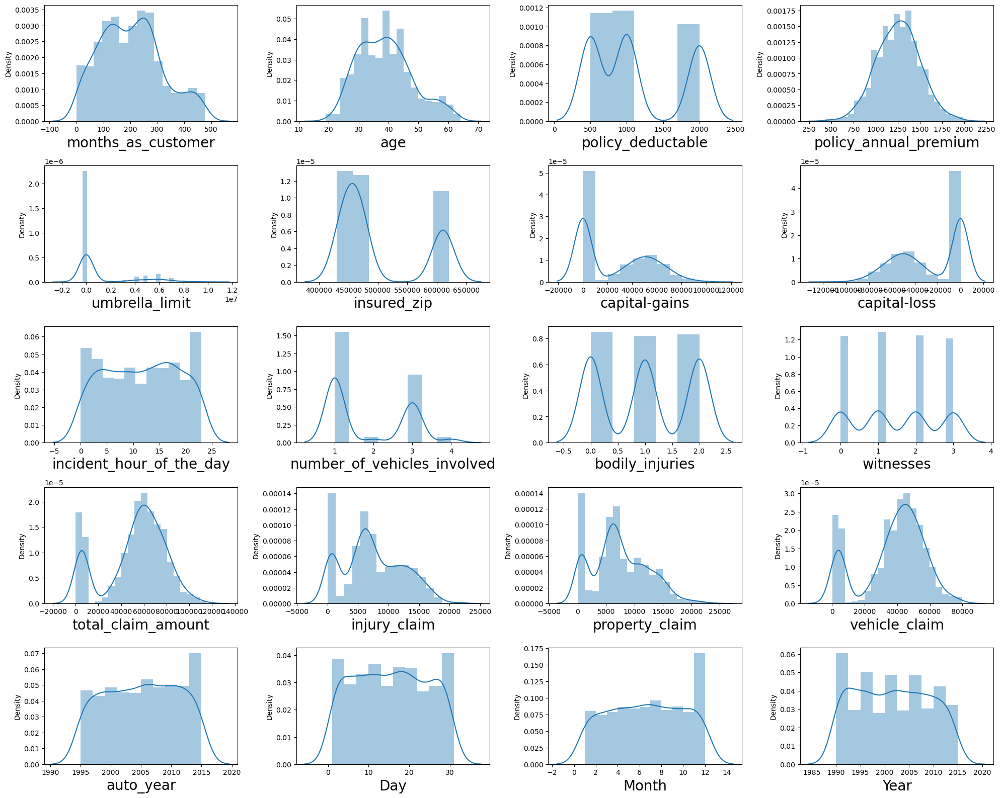

In [79]:
#Checking the Distribution on the DataSet on numerical column
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [86]:
from sklearn.preprocessing import power_transform

columns_to_transform = ['months_as_customer', 'age', 'policy_deductable', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', 'Day', 'Year']

df[columns_to_transform] = power_transform(df[columns_to_transform])


In [87]:
#again finding skewness
df.skew()

months_as_customer            -0.135661
age                           -0.001945
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.023988
policy_annual_premium          0.004402
umbrella_limit                -7.865930
insured_zip                    0.000000
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.038722
capital-loss                   0.090488
incident_date                  0.004756
incident_type                  0.101507
collision_type                -0.193345
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_location              0.000000
incident_hour_of_the_day      -0.256957
number_of_vehicles_involved    0.363693


here we find skewness was removed from some column

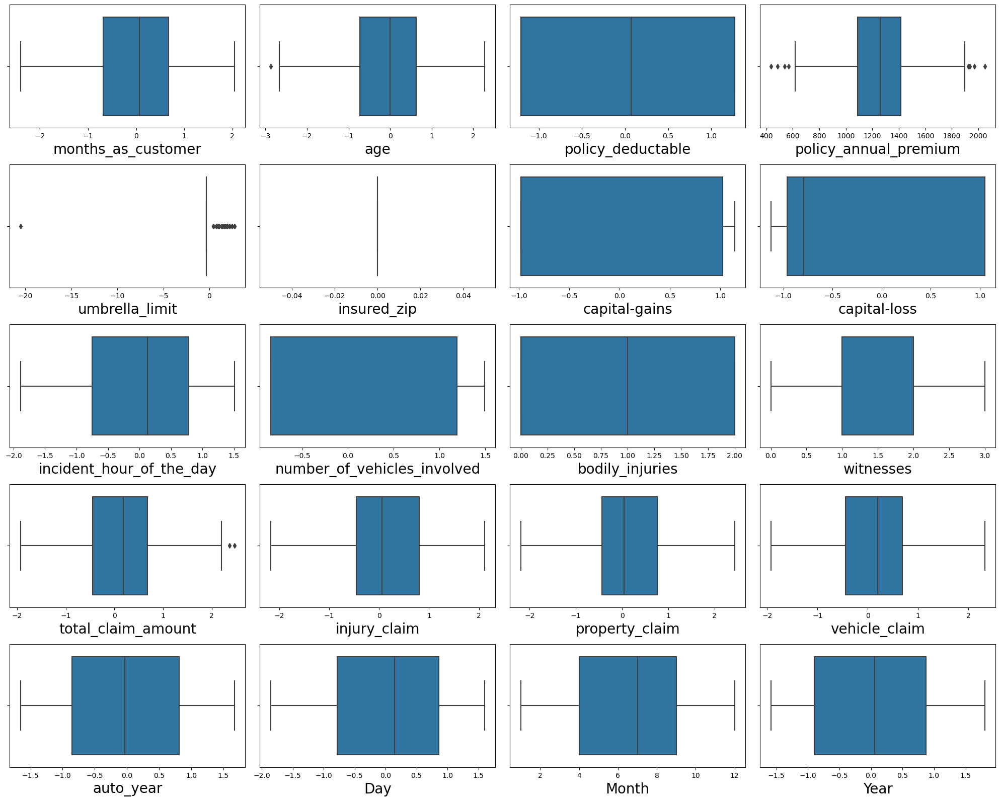

In [90]:
#Checking the outlier the DataSet on numerical column
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.boxplot(df[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

outliers are present in age, policy_annual_premium , umbrella_limit, total_claim_amount

In [91]:
# Outlier removing
df.shape

(1000, 40)

In [92]:
from scipy.stats import zscore

columns = ["age", "policy_annual_premium", "umbrella_limit", "total_claim_amount"]
z = np.abs(zscore(df[columns]))
z

,age,policy_annual_premium,umbrella_limit,total_claim_amount
0,1.008733,0.616705,0.349113,0.715714
1,0.431433,0.242521,1.357817,1.776979
2,1.139513,0.642233,1.357817,0.716825
3,0.327852,0.652886,1.644005,0.391426
4,0.631918,1.341980,1.644005,1.729802
...,...,...,...,...
995,0.002457,0.222884,0.349113,1.338829
996,0.327852,0.739141,0.349113,2.202447
997,0.470444,0.520739,0.756509,0.553012
998,2.130554,0.411866,1.357817,0.247520


In [93]:
threshold=3
np.where(z>3)

(array([229, 248, 290, 763], dtype=int64), array([1, 1, 2, 1], dtype=int64))

In [94]:
df_new=df[(z<3).all(axis=1)]
df_new

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Day,Month,Year
0,1.051279,1.008733,2,1,0.067784,1406.91,-0.349113,0.0,1,4,...,0.005762,1.081793,0.753697,10,1,-0.197455,1,0.254254,10,1.671619
1,0.304536,0.431433,1,1,1.271863,1197.22,1.357817,0.0,1,4,...,-1.525347,-1.557391,-1.786629,8,12,0.302622,1,1.236653,6,0.602609
2,-0.511226,-1.139513,2,0,1.271863,1413.14,1.357817,0.0,0,6,...,0.223833,-0.577507,-0.820881,4,30,0.302622,0,-0.656388,6,-0.210791
3,0.523344,0.327852,0,1,1.271863,1415.74,1.644005,0.0,0,6,...,-0.026762,-0.034793,0.677602,3,34,1.497810,1,1.049715,5,-1.589334
4,0.304536,0.631918,0,2,0.067784,1583.91,1.644005,0.0,1,0,...,-1.304154,-1.622102,-1.740038,0,31,0.640027,0,-1.050168,6,1.671619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-2.287530,0.002457,2,2,0.067784,1310.80,-0.349113,0.0,0,5,...,1.638435,0.403281,1.259186,6,6,0.135129,0,0.148165,7,-1.449974
996,0.741446,0.327852,0,0,0.067784,1436.79,-0.349113,0.0,0,6,...,1.717091,1.767003,1.904757,13,28,1.671841,0,-1.856382,5,1.671619
997,-0.549706,-0.470444,2,1,-1.211269,1383.49,0.756509,0.0,0,5,...,0.188267,0.186095,0.777232,11,19,-1.496278,0,0.254254,2,0.197135
998,1.912654,2.130554,0,2,1.271863,1356.92,1.357817,0.0,1,0,...,-0.251353,-0.265012,-0.104258,1,5,-1.176246,0,0.358635,11,1.272798


In [95]:
df_new.shape

(996, 40)

In [96]:
#data loss in percentage
Data_loss =((df.shape[0]-df_new.shape[0])/df.shape[0])*100
Data_loss

0.4

0.4 is our acceptable data loss range

### scaling

In [97]:
x=df.drop("fraud_reported",axis=1)

In [98]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,Day,Month,Year
0,1.051279,1.008733,1.187173,0.060937,0.067784,0.616705,-0.349113,0.0,1.076953,0.530931,...,0.715714,0.005762,1.081793,0.753697,0.856466,-1.645743,-0.197455,0.254254,1.015026,1.671623
1,0.304536,0.431433,-0.016856,0.060937,1.271863,-0.242521,1.357817,0.0,1.076953,0.530931,...,-1.776979,-1.525347,-1.557391,-1.786629,0.360539,-0.657470,0.302622,1.236653,-0.164894,0.602612
2,-0.511226,-1.139513,1.187173,-1.182668,1.271863,0.642233,1.357817,0.0,-0.928546,1.557877,...,-0.716825,0.223833,-0.577507,-0.820881,-0.631315,0.959702,0.302622,-0.656388,-0.164894,-0.210788
3,0.523344,0.327852,-1.220886,0.060937,1.271863,0.652886,1.644005,0.0,-0.928546,1.557877,...,0.391426,-0.026762,-0.034793,0.677602,-0.879279,1.319074,1.497810,1.049715,-0.459874,-1.589331
4,0.304536,0.631918,-1.220886,1.304542,0.067784,1.341980,1.644005,0.0,1.076953,-1.522961,...,-1.729802,-1.304154,-1.622102,-1.740038,-1.623169,1.049545,0.640027,-1.050168,-0.164894,1.671623
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-2.287530,0.002457,1.187173,1.304542,0.067784,0.222884,-0.349113,0.0,-0.928546,1.044404,...,1.338829,1.638435,0.403281,1.259186,-0.135388,-1.196528,0.135129,0.148165,0.130086,-1.449971
996,0.741446,0.327852,-1.220886,-1.182668,0.067784,0.739141,-0.349113,0.0,-0.928546,1.557877,...,2.202447,1.717091,1.767003,1.904757,1.600357,0.780016,1.671841,-1.856382,-0.459874,1.671623
997,-0.549706,-0.470444,1.187173,0.060937,-1.211269,0.520739,0.756509,0.0,-0.928546,1.044404,...,0.553012,0.188267,0.186095,0.777232,1.104430,-0.028570,-1.496278,0.254254,-1.344813,0.197138
998,1.912654,2.130554,-1.220886,1.304542,1.271863,0.411866,1.357817,0.0,1.076953,-1.522961,...,-0.247520,-0.251353,-0.265012,-0.104258,-1.375206,-1.286371,-1.176246,0.358635,1.310006,1.272801


### oversampling data using SMOTE

In [99]:
y = df["fraud_reported"]

In [100]:
# oversampling data
from imblearn.over_sampling import SMOTE
smt=SMOTE()

In [101]:
x,y=smt.fit_resample(x,y)

In [102]:
y.value_counts()

1    753
0    753
Name: fraud_reported, dtype: int64

our dataset is balanced now

### Checking VIF Values

In [103]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,5.328328,months_as_customer
1,5.333760,age
2,1.067452,policy_state
3,1.045553,policy_csl
4,1.085248,policy_deductable
5,1.073878,policy_annual_premium
6,1.048591,umbrella_limit
7,NaN,insured_zip
8,1.051223,insured_sex
9,1.039577,insured_education_level


here we observed that vif value is greater than 10, so multicolliarity problem exist, for removing this proble we have to drop  a column

In [104]:
# dropping a column to reduce vif value
x.drop("total_claim_amount",axis=1,inplace=True)

In [105]:
# again checking for vif values

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,5.327920,months_as_customer
1,5.330259,age
2,1.067395,policy_state
3,1.043181,policy_csl
4,1.082975,policy_deductable
5,1.064948,policy_annual_premium
6,1.046895,umbrella_limit
7,NaN,insured_zip
8,1.048105,insured_sex
9,1.039533,insured_education_level


Multicolliarity was successfully removed

### Model Building

In [106]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score

In [108]:
#finding best random state
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.2, random_state =i)
    DTC = DecisionTreeClassifier()
    DTC.fit(x_train, y_train)
    pred = DTC.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.8841059602649006  on Random_state  33


In [110]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.2, random_state =33)

### Logistic Regression

In [111]:
#cross validation score for logistic regresson
logreg=LogisticRegression()
logreg.fit(x_train,y_train)
LR_predicted=logreg.predict(x_test)
lss=accuracy_score(y_test,LR_predicted)
for j in range(2,10):
    lssscore=cross_val_score(logreg,x,y,cv=j)
    lsc=lssscore.mean()
    print("At CV:",j)
    print("Cross validation score is:",lsc*100)
    print("Accuracy score is:",lss*100)

At CV: 2
Cross validation score is: 74.30278884462152
Accuracy score is: 79.13907284768213
At CV: 3
Cross validation score is: 73.97078353253652
Accuracy score is: 79.13907284768213
At CV: 4
Cross validation score is: 74.10477453580901
Accuracy score is: 79.13907284768213
At CV: 5
Cross validation score is: 74.37174099579768
Accuracy score is: 79.13907284768213
At CV: 6
Cross validation score is: 74.23638778220453
Accuracy score is: 79.13907284768213
At CV: 7
Cross validation score is: 74.37215454657314
Accuracy score is: 79.13907284768213
At CV: 8
Cross validation score is: 74.10784644827199
Accuracy score is: 79.13907284768213
At CV: 9
Cross validation score is: 74.17506257326617
Accuracy score is: 79.13907284768213


cv=7 selected

In [112]:
logreg_score=cross_val_score(logreg,x_train,y_train,cv=7,scoring='accuracy')

LR_predicted=logreg.predict(x_test)

print(confusion_matrix(y_test,LR_predicted))
print(classification_report(y_test,LR_predicted))
print("Training accuracy::",logreg.score(x_train,y_train))
print("Test accuracy::",logreg.score(x_test,y_test))
print("accuracy",accuracy_score(y_test,LR_predicted))
print("cross validation score:",np.mean(logreg_score))

[[112  39]
 [ 24 127]]
              precision    recall  f1-score   support

           0       0.82      0.74      0.78       151
           1       0.77      0.84      0.80       151

    accuracy                           0.79       302
   macro avg       0.79      0.79      0.79       302
weighted avg       0.79      0.79      0.79       302

Training accuracy:: 0.7491694352159468
Test accuracy:: 0.7913907284768212
accuracy 0.7913907284768212
cross validation score: 0.7275747508305648


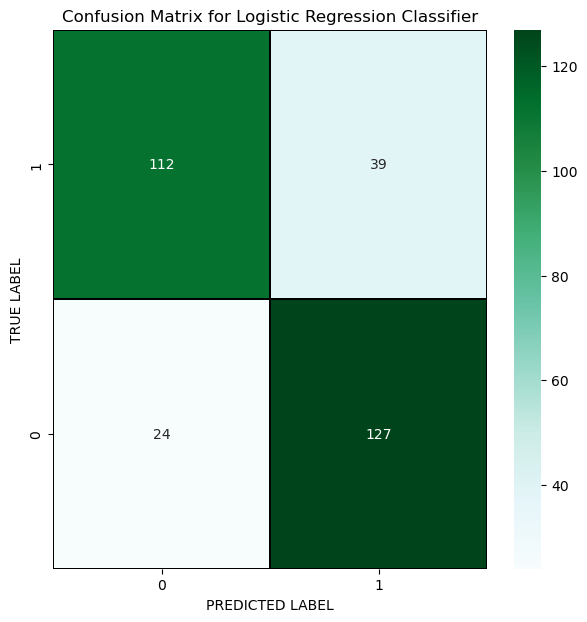

In [113]:
# Lets plot confusion matrix for Logistic Regression
cm = confusion_matrix(y_test,LR_predicted)

x_axis_labels = ["0","1"]
y_axis_labels = ["1","0"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Logistic Regression Classifier')
plt.show()

### decision tree classifier

In [114]:
dtc=DecisionTreeClassifier()
dtc_score=cross_val_score(dtc,x,y,cv=7,scoring='accuracy')

dtc.fit(x_train,y_train)
predicted_dtc=dtc.predict(x_test)

print(confusion_matrix(y_test,predicted_dtc))
print(classification_report(y_test,predicted_dtc))
print("Training accuracy::",dtc.score(x_train,y_train))
print("Test accuracy::",dtc.score(x_test,y_test))
print("cross validation score :",np.mean(dtc_score))
print("accuracy",accuracy_score(y_test,predicted_dtc))

[[124  27]
 [ 16 135]]
              precision    recall  f1-score   support

           0       0.89      0.82      0.85       151
           1       0.83      0.89      0.86       151

    accuracy                           0.86       302
   macro avg       0.86      0.86      0.86       302
weighted avg       0.86      0.86      0.86       302

Training accuracy:: 1.0
Test accuracy:: 0.8576158940397351
cross validation score : 0.8280607850375292
accuracy 0.8576158940397351


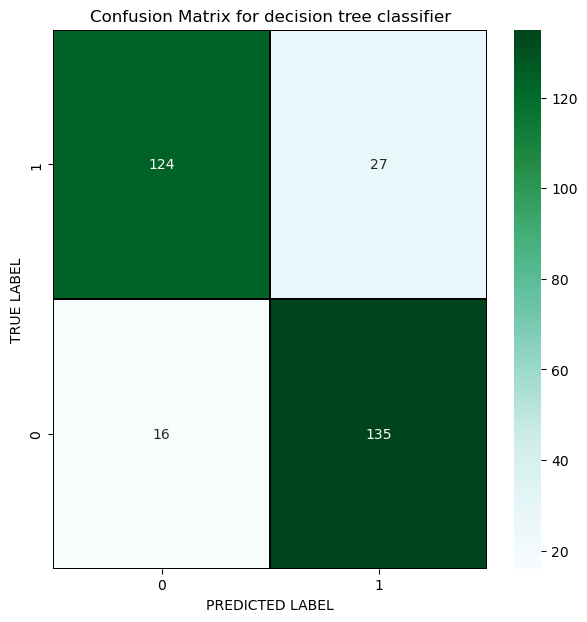

In [115]:
# Lets plot confusion matrix for decision tree classifier
cm = confusion_matrix(y_test,predicted_dtc)

x_axis_labels = ["0","1"]
y_axis_labels = ["1","0"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for decision tree classifier')
plt.show()

### KNeighborsClassifier

In [116]:
knn=KNeighborsClassifier()
knn_score=cross_val_score(knn,x,y,cv=7,scoring='accuracy')

knn.fit(x_train,y_train)
predicted_knn=knn.predict(x_test)

print(confusion_matrix(y_test,predicted_knn))
print(classification_report(y_test,predicted_knn))
print("Training accuracy::",knn.score(x_train,y_train))
print("Test accuracy::",knn.score(x_test,y_test))
print("cross validation score for knn:",np.mean(knn_score))
print("accuracy",accuracy_score(y_test,predicted_knn))

[[ 40 111]
 [  4 147]]
              precision    recall  f1-score   support

           0       0.91      0.26      0.41       151
           1       0.57      0.97      0.72       151

    accuracy                           0.62       302
   macro avg       0.74      0.62      0.56       302
weighted avg       0.74      0.62      0.56       302

Training accuracy:: 0.7142857142857143
Test accuracy:: 0.6192052980132451
cross validation score for knn: 0.6494247569828965
accuracy 0.6192052980132451


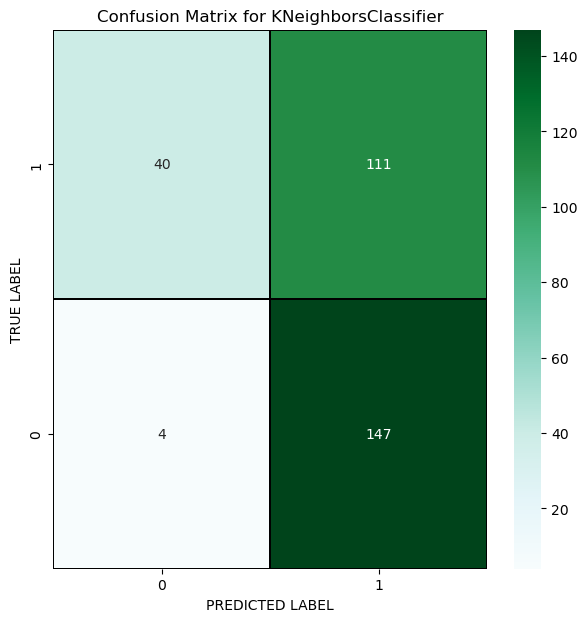

In [117]:
# Lets plot confusion matrix for KNeighborsClassifier
cm = confusion_matrix(y_test,predicted_knn)

x_axis_labels = ["0","1"]
y_axis_labels = ["1","0"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for KNeighborsClassifier')
plt.show()

### Naive baised classifier

In [118]:
gs=GaussianNB()
gs_score=cross_val_score(gs,x,y,cv=7,scoring='accuracy')

gs.fit(x_train,y_train)
predicted_gs=gs.predict(x_test)

print(confusion_matrix(y_test,predicted_gs))
print(classification_report(y_test,predicted_gs))
print("Training accuracy::",gs.score(x_train,y_train))
print("Test accuracy::",gs.score(x_test,y_test))
print("cross validation score :",np.mean(gs_score))
print("accuracy",accuracy_score(y_test,predicted_gs))

[[ 97  54]
 [ 15 136]]
              precision    recall  f1-score   support

           0       0.87      0.64      0.74       151
           1       0.72      0.90      0.80       151

    accuracy                           0.77       302
   macro avg       0.79      0.77      0.77       302
weighted avg       0.79      0.77      0.77       302

Training accuracy:: 0.7225913621262459
Test accuracy:: 0.7715231788079471
cross validation score : 0.711178786760182
accuracy 0.7715231788079471


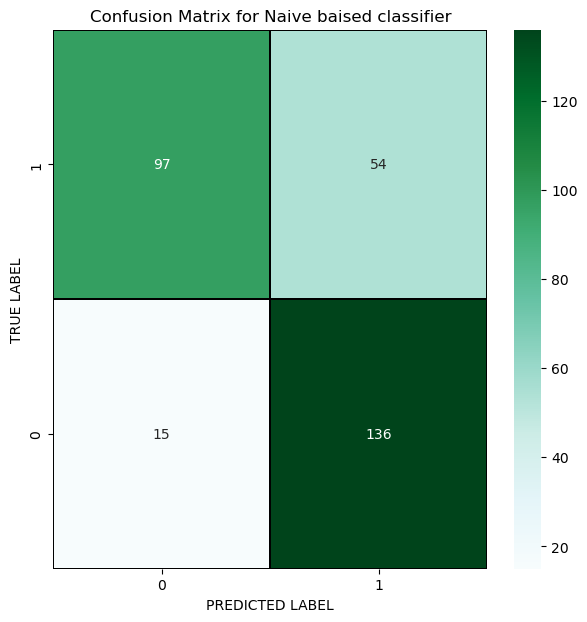

In [119]:
# Lets plot confusion matrix for Naive baised classifier
cm = confusion_matrix(y_test,predicted_gs)

x_axis_labels = ["0","1"]
y_axis_labels = ["1","0"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Naive baised classifier')
plt.show()

### Ensemble method

### RandomForestClassifier

In [120]:
rfc=RandomForestClassifier()
rfc_score=cross_val_score(rfc,x,y,cv=7,scoring='accuracy')

rfc.fit(x_train,y_train)
predicted_rfc=rfc.predict(x_test)

print(confusion_matrix(y_test,predicted_rfc))
print(classification_report(y_test,predicted_rfc))
print("Training accuracy::",rfc.score(x_train,y_train))
print("Test accuracy::",rfc.score(x_test,y_test))
print("cross validation score ",np.mean(rfc_score))
print("accuracy",accuracy_score(y_test,predicted_rfc))

[[135  16]
 [ 10 141]]
              precision    recall  f1-score   support

           0       0.93      0.89      0.91       151
           1       0.90      0.93      0.92       151

    accuracy                           0.91       302
   macro avg       0.91      0.91      0.91       302
weighted avg       0.91      0.91      0.91       302

Training accuracy:: 1.0
Test accuracy:: 0.9139072847682119
cross validation score  0.8792174234034699
accuracy 0.9139072847682119


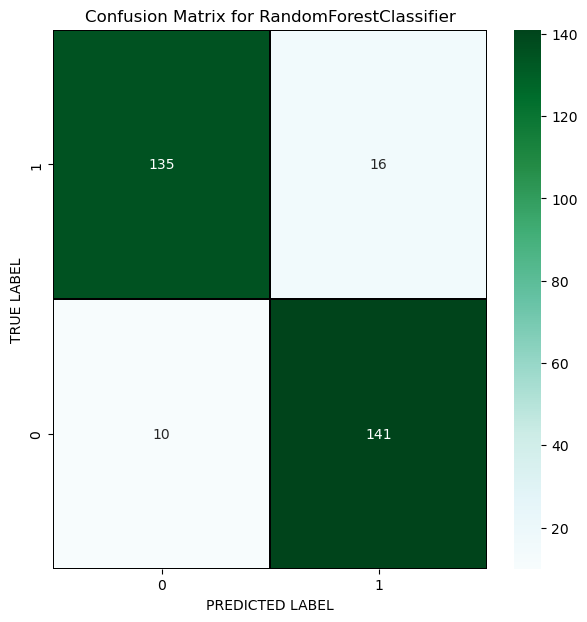

In [121]:
# Lets plot confusion matrix 
cm = confusion_matrix(y_test,predicted_rfc)

x_axis_labels = ["0","1"]
y_axis_labels = ["1","0"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()

### ADA BOOST CLASSIFIER

In [122]:
adb=AdaBoostClassifier()
adb_score=cross_val_score(adb,x,y,cv=7,scoring='accuracy')

adb.fit(x_train,y_train)
predicted_adb=adb.predict(x_test)

print(confusion_matrix(y_test,predicted_adb))
print(classification_report(y_test,predicted_adb))
print("Training accuracy::",adb.score(x_train,y_train))
print("Test accuracy::",adb.score(x_test,y_test))
print("cross validation score for Ada boost:",np.mean(adb_score))
print("accuracy",accuracy_score(y_test,predicted_adb))

[[133  18]
 [ 16 135]]
              precision    recall  f1-score   support

           0       0.89      0.88      0.89       151
           1       0.88      0.89      0.89       151

    accuracy                           0.89       302
   macro avg       0.89      0.89      0.89       302
weighted avg       0.89      0.89      0.89       302

Training accuracy:: 0.8837209302325582
Test accuracy:: 0.8874172185430463
cross validation score for Ada boost: 0.8460471268610804
accuracy 0.8874172185430463


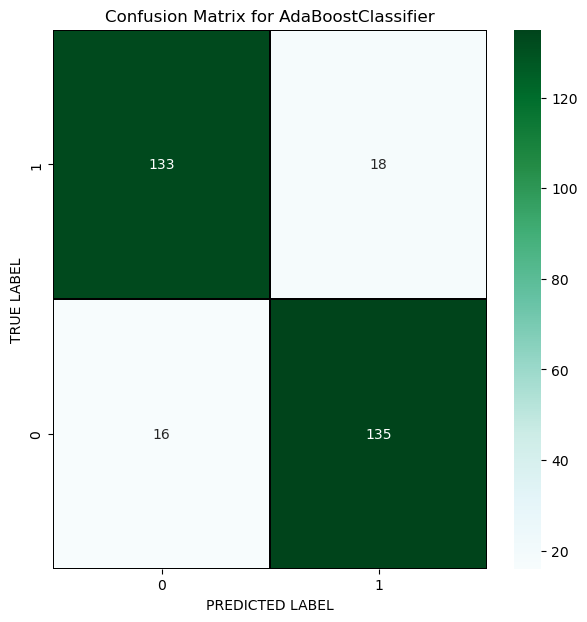

In [123]:
# Lets plot confusion matrix 
cm = confusion_matrix(y_test,predicted_adb)

x_axis_labels = ["0","1"]
y_axis_labels = ["1","0"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for AdaBoostClassifier')
plt.show()

### Gradient Boosting classifier

In [124]:
grbc=GradientBoostingClassifier()
grbc_score=cross_val_score(grbc,x,y,cv=7,scoring='accuracy')

grbc.fit(x_train,y_train)
predicted_grbc=grbc.predict(x_test)

print(confusion_matrix(y_test,predicted_grbc))
print(classification_report(y_test,predicted_grbc))
print("Training accuracy::",grbc.score(x_train,y_train))
print("Test accuracy::",grbc.score(x_test,y_test))
print("cross validation score for Gradient Boosting Classifier:",np.mean(grbc_score))
print("accuracy",accuracy_score(y_test,predicted_grbc))

[[133  18]
 [  9 142]]
              precision    recall  f1-score   support

           0       0.94      0.88      0.91       151
           1       0.89      0.94      0.91       151

    accuracy                           0.91       302
   macro avg       0.91      0.91      0.91       302
weighted avg       0.91      0.91      0.91       302

Training accuracy:: 0.9617940199335548
Test accuracy:: 0.9105960264900662
cross validation score for Gradient Boosting Classifier: 0.8785498954103605
accuracy 0.9105960264900662


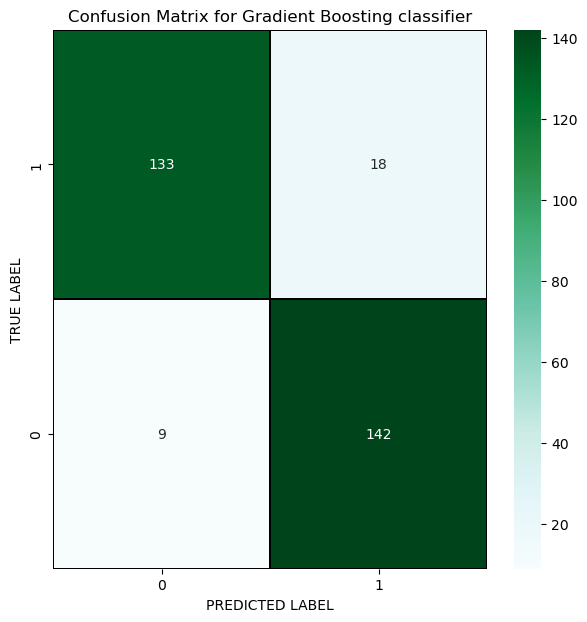

In [125]:
# Lets plot confusion matrix 
cm = confusion_matrix(y_test,predicted_grbc)

x_axis_labels = ["0","1"]
y_axis_labels = ["1","0"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Gradient Boosting classifier')
plt.show()

### BAGGING CLASSIFIER

In [126]:
bgc=BaggingClassifier()
bgc_score=cross_val_score(bgc,x,y,cv=7,scoring='accuracy')
bgc.fit(x_train,y_train)
predicted_bgc=bgc.predict(x_test)
print(accuracy_score(y_test,predicted_bgc))
print(confusion_matrix(y_test,predicted_bgc))
print(classification_report(y_test,predicted_bgc))
print("Training accuracy::",bgc.score(x_train,y_train))
print("Test accuracy::",bgc.score(x_test,y_test))
print("cross validation score for BAGGING Classifier:",np.mean(bgc_score))

0.9205298013245033
[[138  13]
 [ 11 140]]
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       151
           1       0.92      0.93      0.92       151

    accuracy                           0.92       302
   macro avg       0.92      0.92      0.92       302
weighted avg       0.92      0.92      0.92       302

Training accuracy:: 0.9933554817275747
Test accuracy:: 0.9205298013245033
cross validation score for BAGGING Classifier: 0.8586286452565522


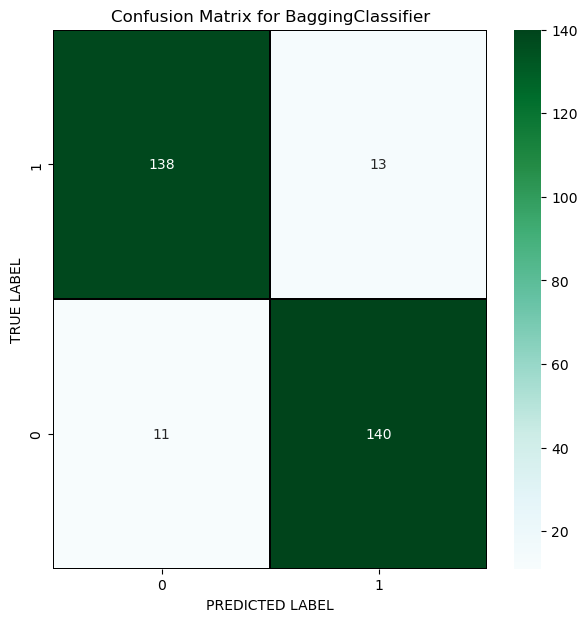

In [127]:
# Lets plot confusion matrix 
cm = confusion_matrix(y_test,predicted_bgc)

x_axis_labels = ["0","1"]
y_axis_labels = ["1","0"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for BaggingClassifier')
plt.show()

### Extra Trees Classifier


In [128]:
xtc = ExtraTreesClassifier()
xtc_score=cross_val_score(xtc,x,y,cv=7,scoring='accuracy')
xtc.fit(x_train,y_train)
predicted_xtc=xtc.predict(x_test)
print(accuracy_score(y_test,predicted_xtc))
print(confusion_matrix(y_test,predicted_xtc))
print(classification_report(y_test,predicted_xtc))
print("Training accuracy::",xtc.score(x_train,y_train))
print("Test accuracy::",xtc.score(x_test,y_test))
print("cross validation score for Extra Trees Classifier:",np.mean(xtc_score))

0.9304635761589404
[[135  16]
 [  5 146]]
              precision    recall  f1-score   support

           0       0.96      0.89      0.93       151
           1       0.90      0.97      0.93       151

    accuracy                           0.93       302
   macro avg       0.93      0.93      0.93       302
weighted avg       0.93      0.93      0.93       302

Training accuracy:: 1.0
Test accuracy:: 0.9304635761589404
cross validation score for Extra Trees Classifier: 0.9097422173003569


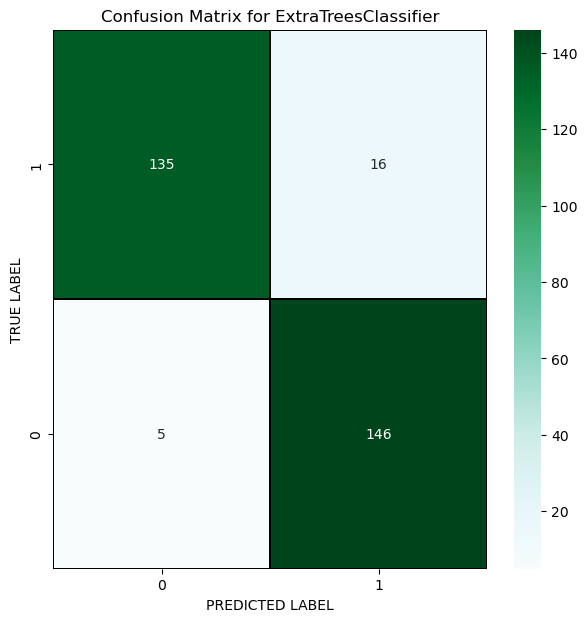

In [129]:
# Lets plot confusion matrix 
cm = confusion_matrix(y_test,predicted_xtc)

x_axis_labels = ["0","1"]
y_axis_labels = ["1","0"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for ExtraTreesClassifier')
plt.show()

In [130]:
#Accuracy and cross validation score for different model
print("Logistic regression")
print("accuracy",accuracy_score(y_test,LR_predicted))
print("cross validation score:",np.mean(logreg_score))

print("Decision tree classifier")
print("cross validation score :",np.mean(dtc_score))
print("accuracy",accuracy_score(y_test,predicted_dtc))

print("KNeighborsClassifier")
print("cross validation score for knn:",np.mean(knn_score))
print("accuracy",accuracy_score(y_test,predicted_knn))

print("Naive baised classifier")
print("cross validation score :",np.mean(gs_score))
print("accuracy",accuracy_score(y_test,predicted_gs))


print("RandomForestClassifier")
print("cross validation score for ",np.mean(rfc_score))
print("accuracy",accuracy_score(y_test,predicted_rfc))


print("Ada boost Classifier")
print("cross validation score for Ada boost:",np.mean(adb_score))
print("accuracy",accuracy_score(y_test,predicted_adb))


print("Gradient Boosting Classifier")
print("cross validation score for Gradient Boosting Classifier:",np.mean(grbc_score))
print("accuracy",accuracy_score(y_test,predicted_grbc))


print("BAGGING Classifier")
print("Test accuracy::",bgc.score(x_test,y_test))
print("cross validation score for BAGGING Classifier:",np.mean(bgc_score))

print("Extra Trees Classifier")
print("Test accuracy::",xtc.score(x_test,y_test))
print("cross validation score for Extra Trees Classifier:",np.mean(xtc_score))

Logistic regression
accuracy 0.7913907284768212
cross validation score: 0.7275747508305648
Decision tree classifier
cross validation score : 0.8280607850375292
accuracy 0.8576158940397351
KNeighborsClassifier
cross validation score for knn: 0.6494247569828965
accuracy 0.6192052980132451
Naive baised classifier
cross validation score : 0.711178786760182
accuracy 0.7715231788079471
RandomForestClassifier
cross validation score for  0.8792174234034699
accuracy 0.9139072847682119
Ada boost Classifier
cross validation score for Ada boost: 0.8460471268610804
accuracy 0.8874172185430463
Gradient Boosting Classifier
cross validation score for Gradient Boosting Classifier: 0.8785498954103605
accuracy 0.9105960264900662
BAGGING Classifier
Test accuracy:: 0.9205298013245033
cross validation score for BAGGING Classifier: 0.8586286452565522
Extra Trees Classifier
Test accuracy:: 0.9304635761589404
cross validation score for Extra Trees Classifier: 0.9097422173003569


Extra Trees Classifier have highest accuracy=93.04 and cross validation score 0.9097, so Extra Trees Classifier selected for modelling

### Hyper parameter tuning

In [131]:
# Define the parameter grid for tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

# Perform grid search cross-validation
grid_search = GridSearchCV(xtc, param_grid=param_grid, cv=8)
grid_search.fit(x, y)

# Print the best hyperparameters found
print("Best parameters: ", grid_search.best_params_)

Best parameters:  {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}


In [142]:
final = ExtraTreesClassifier(max_depth=None, min_samples_split=2, n_estimators=200)

In [143]:
final.fit(x_train, y_train)
pred = final.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

93.04635761589404


I got accuracy 93.04% after hyperparameter tunning

### roc auc curve

In [144]:
from sklearn.metrics import roc_auc_score

In [145]:
print("roc auc score::",roc_auc_score(y_test, pred))

roc auc score:: 0.9304635761589405


In [146]:
from sklearn.metrics import roc_curve

In [147]:
fpr1, tpr1, thresh1 = roc_curve(y_test,pred, pos_label=1)

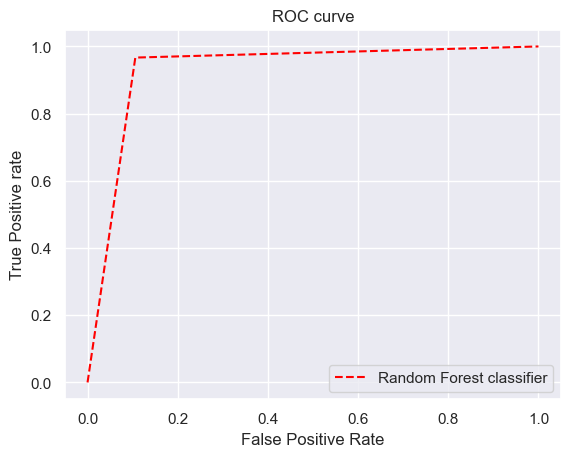

In [148]:
#plotting ROC CURVE
sns.set_theme(style="darkgrid")
plt.plot(fpr1, tpr1, linestyle='--',color='red', label='Random Forest classifier')

plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')

### Saving model

In [150]:
#importing library
import joblib
#saving the model
joblib.dump(xtc,'insurance_fraud.pkl')

['insurance_fraud.pkl']

In [151]:
# Loading the saved model
model=joblib.load('insurance_fraud.pkl')
#Prediction
prediction = model.predict(x_test)
pd.DataFrame([model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"]).T

,Predicted,Original
0,0,0
1,0,0
2,1,1
3,0,0
4,1,1
...,...,...
297,0,0
298,1,1
299,1,1
300,1,1


Here we observed that predicted and original value are almost same